In [1]:
# Packages
# Core scientific computing
import numpy as np
import pandas as pd
import xarray as xr
import math
import csv

# Plotting
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from matplotlib.patches import Rectangle
import cmocean
%matplotlib inline

# Statistical analysis
import scipy.stats as stats
from scipy.stats import norm
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d, griddata, RegularGridInterpolator
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Geospatial and oceanographic
import gsw
from geopy.distance import geodesic
import geopy.distance
from pyproj import Transformer, Geod
from geographiclib.geodesic import Geodesic
from shapely.geometry import LineString, Point

# Mapping
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# System
import os
from typing import Tuple

# Definitions 
Here is variables used in data processing, subseting, and analysis

In [2]:
# Geographic bounds for Solitary Canyon region
# Note: lat_min_s is the NORTHERN bound (less negative); lat_max_s is the SOUTHERN bound
lat_min_s = -29.9
lat_max_s = -30.3
lon_min_s = 153.5
lon_max_s = 153.9

# Period boundaries
# date1: end of EAC-onshore period (inclusive upper bound for period 1)
# date2: start of EAC-offshore period (inclusive lower bound for period 2)
date1_start = np.datetime64('2024-06-09')
date1_end = np.datetime64('2024-06-17')
date2_start = np.datetime64('2024-06-23')
date2_end = np.datetime64('2024-06-29')

In [3]:
# Coriolis parameter at 30 deg S:  |f| = 2*Omega*|sin(phi)|
# Omega = 7.2921e-5 rad/s,  phi = -30 deg (southern hemisphere, sign handled by abs)
f = np.abs(2 * (7.2921e-5) * np.sin(np.radians(-30)))

# Data loading and processing
Here we load and all data used for generating figures 

Satellite data products include
- 
- 

Investigator datasets include: SADCP, LADCP, CTD, microstructure

SADCP, LADCP, and CTD are available from

In [4]:
# ── DATA PATHS ───────────────────────────────────────────────────────────────
# Set DATA_ROOT to the top-level directory containing all instrument data.
DATA_ROOT   = "C:/Users/uqmjef10/OneDrive - The University of Queensland/Documents/PhD/data"

BATHY_PATH  = f"{DATA_ROOT}/dataset-b5adeecd-7952-4dda-9bda-3eafb23efb70/1_Multibeam Dataset of Australia 2018 50m.nc"
BATHY_LARGE_PATH = 'C:/Users/uqmjef10/OneDrive - The University of Queensland/Documents/past uni/Honours/data/gebco_2023_n-10.0_s-44.0_w145.0_e165.0.nc'
SADCP_PATH  = f"{DATA_ROOT}/IDC_IN2024_V04_adcp_5637/IN2024_V04_os75nb.nc"
LADCP_PATH  = f"{DATA_ROOT}/ladcp/ladcp/processing"
CTD_PATH    = f"{DATA_ROOT}/IDC_IN2024_V04_ctd_5644/IN2024_V04_CTD_average_nc/"
MIXING_PATH = f"{DATA_ROOT}/Mixing/"
COORDS_FILE = f"{DATA_ROOT}/ctd_coordinates.csv"
NUT_PATH    = f"{DATA_ROOT}/IDC_IN2024_V04_hydro_5529/IN2024_V04_HYD_Deployments_NetCDF/IN2024_V04_Hydro_Deployments_NetCDF/"

In [5]:
# ── Shared cast-selection helpers ────────────────────────────────────────────
# All instrument dicts use integer cast numbers as keys (e.g. 42).
# xr.Dataset entries must carry attrs: latitude, longitude, time (as str).
# pd.DataFrame entries must have columns: latitude, longitude, time.

def subset_by_location(cast_dict, lat_min, lat_max, lon_min, lon_max):
    """Return only casts inside the bounding box.

    lat_min/lat_max are southern/northern bounds (lat_min < lat_max).
    """
    result = {}
    for k, ds in cast_dict.items():
        if isinstance(ds, pd.DataFrame):
            lat = ds['latitude'].iloc[0]
            lon = ds['longitude'].iloc[0]
        else:
            lat = float(ds['latitude'])
            lon = float(ds['longitude'])
        if lat_min <= lat <= lat_max and lon_min <= lon <= lon_max:
            result[k] = ds
    return result


def subset_by_period(cast_dict, before=None, after=None):
    """Return casts from period 1 (before) or period 2 (after).

    before=date1  -> period 1: casts with time <= date1
    after=date2   -> period 2: casts with time >= date2
    Bounds are inclusive.
    """
    result = {}
    for k, ds in cast_dict.items():
        if isinstance(ds, pd.DataFrame):
            t = np.datetime64(ds['time'].iloc[0])
        else:
            t = ds['time']
        if before is not None and t > before:
            continue
        if after is not None and t < after:
            continue
        result[k] = ds
    return result

In [6]:
bathy = xr.open_dataset(BATHY_PATH)
# Subset with a small buffer around Solitary Canyon
bathy = bathy.sel(lat=slice(-30.4, -29.8), lon=slice(153.4, 154.0))
lon_bathy, lat_bathy = np.meshgrid(bathy.lon, bathy.lat)
bathy_data = bathy.Band1

In [7]:
bathy_large=xr.open_dataset(BATHY_LARGE_PATH)

In [8]:
# Shipboard ADCP (SADCP)
adcp = xr.open_dataset(SADCP_PATH)

In [9]:
# Subset SADCP to Solitary Canyon region.
sol_adcp=adcp.where((adcp.lon>lon_min_s)&(adcp.lon<lon_max_s)&(adcp.lat<lat_min_s)&(adcp.lat>lat_max_s))
sol1_adcp=sol_adcp.sel(time=slice(sol_adcp.time.min(),date1_end))
sol2_adcp=sol_adcp.sel(time=slice(date2_start,sol_adcp.time.max()))

In [10]:
def load_ladcp_casts(cast_path, last_cast, skip_casts=None):
    """Load LADCP processed NetCDF files.

    Parameters
    ----------
    cast_path  : str  Path to the LADCP processing directory.
    last_cast  : int  Highest cast number to attempt.
    skip_casts : set  Cast numbers to skip. Default {1}: instrument not yet stable.

    Returns
    -------
    dict  {int cast_num -> xr.Dataset}
        depth coordinate is positive downward (metres).
        attrs: cast_number, latitude, longitude, max_depth.
    """
    if skip_casts is None:
        skip_casts = {1}  # Cast 1 skipped: test cast

    casts = {}
    for cast_num in range(1, last_cast + 1):
        if cast_num in skip_casts:
            continue
        filepath = os.path.join(cast_path, 'processed_test', f'{cast_num:03d}.nc')
        try:
            ds = xr.open_dataset(filepath)
            lat = float(ds['lat'])
            lon = float(ds['lon'])
            if lon == 0.0:  # 0.0 flags a failed GPS fix
                ds.close()
                continue
            cast_ds = xr.Dataset(
                {'u': ds['u'], 'v': ds['v']},
                coords={'longitude': lon, 'latitude': lat, 'depth': ds['z']},
                attrs={'cast_number': cast_num}
            )
            ds.close()
            casts[cast_num] = cast_ds
        except (FileNotFoundError, KeyError):
            continue
    return casts

In [11]:
ladcp_data = load_ladcp_casts(LADCP_PATH, last_cast=100)

# Geographic subset
# Note: LADCP files do not carry a time attribute; temporal subsetting is not applied.
sol_ladcp = subset_by_location(ladcp_data, lat_max_s, lat_min_s, lon_min_s, lon_max_s)

In [12]:
def read_ctd_file(filepath):
    """Read and process a single CTD NetCDF file.

    Returns an xr.Dataset with a single 'depth' dimension (positive downward, metres).
    GSW TEOS-10 derived variables SA, CT, sigma0 are computed from raw SP and T.
    attrs: cast_number (int), latitude, longitude, time (str).
    """
    ds = xr.open_dataset(filepath, engine='netcdf4')
    pressure    = ds['pressure'].values
    temperature = ds['temperature'].values
    salinity    = ds['salinity'].values
    oxygen      = ds['oxygen'].values
    fluorometer = ds['fluorometer'].values
    par         = ds['par'].values
    latitude    = float(ds['latitude'].values[0])
    longitude   = float(ds['longitude'].values[0])
    time        = ds['time'].values[0]
    ds.close()

    # Reshape pressure for GSW calculations
    pressure_reshaped = np.reshape(pressure, (1, 1, len(pressure), 1))
    
    # Calculate oceanographic properties
    SA = gsw.SA_from_SP(salinity, pressure_reshaped, longitude, latitude)
    CT = gsw.CT_from_t(SA, temperature, pressure_reshaped)
    sigma0 = gsw.sigma0(SA, CT)
    depth = -1*gsw.z_from_p(pressure, latitude)

    cast_number = int(''.join(filter(str.isdigit, os.path.basename(filepath)))[-3:])

    # Create new dataset
    new_ds = xr.Dataset(
        {
            'temperature': (('longitude', 'latitude', 'depth', 'time'), temperature),
            'salinity': (('longitude', 'latitude', 'depth', 'time'), salinity),
            'oxygen': (('longitude', 'latitude', 'depth', 'time'), oxygen),
            'fluorometer': (('longitude', 'latitude', 'depth', 'time'), fluorometer),
            'par': (('longitude', 'latitude', 'depth', 'time'), par),
            'density': (('longitude', 'latitude', 'depth', 'time'), sigma0),
            'pressure': (('depth',), pressure)
        },
        coords={
            'longitude': ('longitude', [longitude]),
            'latitude': ('latitude', [latitude]),
            'depth': ('depth', depth),
            'time': ('time', [time]),
            'cast': cast_number
        }
    )
    
    # Also store as attribute
    new_ds.attrs['cast'] = cast_number

    
    return new_ds


def load_ctd_casts(folder_path,last_cast):
    """Load all CTD NetCDF files. Returns dict {int cast_num -> xr.Dataset}."""
    nc_files = sorted(f for f in os.listdir(folder_path) if f.endswith('.nc'))
    casts = {}
    for nc_file in nc_files:
        cast_number = int(''.join(filter(str.isdigit, nc_file))[-3:])
        if cast_number <= last_cast:
            try:
                casts[cast_number] = read_ctd_file(os.path.join(folder_path, nc_file))
            except Exception as e:
                print(f'Failed to load CTD cast {cast_number} ({nc_file}): {e}')
    return casts

In [13]:
ctd_data = load_ctd_casts(CTD_PATH,100)

sol_ctd  = subset_by_location(ctd_data, lat_max_s, lat_min_s, lon_min_s, lon_max_s)
sol1_ctd = subset_by_period(sol_ctd, before=date1_end)
sol2_ctd = subset_by_period(sol_ctd, after=date2_start)

In [14]:
def load_mixing_casts(folder_path, coords_path):
    """Load microstructure (VMP) CSV files.

    Parameters
    ----------
    folder_path : str  Directory of per-cast CSV files.
    coords_path : str  ctd_coordinates.csv with columns [ctd, latitude, longitude,
                       and optionally time].

    Returns
    -------
    dict  {int cast_num -> pd.DataFrame}
        depth is positive downward (metres).
        dist_from_bottom is distance above the seafloor (metres, positive upward).
        eps, chi, Kt, Krho are two-probe-averaged dissipation estimates.
    """
    col_names = [
        'CTD Pressure', 'T090', 'Salinity', 'Density', 'N2',
        'FP07 Pressure', 'epsT1', 'epsT2', 'KrhoT1', 'KrhoT2',
        'chiT1', 'chiT2', 'KtT1', 'KtT2', 'Density Ratio', 'W'
    ]
    coords = pd.read_csv(coords_path)
    casts = {}

    for mix_file in sorted(f for f in os.listdir(folder_path) if f.endswith('.csv')):
        cast_num = int(''.join(filter(str.isdigit, mix_file))[0:3])
        try:
            df = pd.read_csv(os.path.join(folder_path, mix_file), header=None)
            df.columns = col_names
            df['cast_num'] = cast_num

            coord_match = coords[coords['ctd'] == f'ctd_{cast_num:03d}']
            if coord_match.empty:
                print(f'Warning: no coordinates for mixing cast {cast_num}; skipping.')
                continue

            df['latitude']  = coord_match['latitude'].values[0]
            df['longitude'] = coord_match['longitude'].values[0]


            # Depth positive downward (gsw.z_from_p returns negative values)
            df['depth'] = -1*gsw.z_from_p(df['CTD Pressure'], df['latitude'].iloc[0])
            # Distance from seafloor (positive upward)
            df['dist_from_bottom'] = df['depth'].max() - df['depth']

            # Probe-averaged dissipation estimates
            df['eps']  = df[['epsT1',  'epsT2']].mean(axis=1)
            df['chi']  = df[['chiT1',  'chiT2']].mean(axis=1)
            df['Kt']   = df[['KtT1',   'KtT2']].mean(axis=1)
            df['Krho'] = df[['KrhoT1', 'KrhoT2']].mean(axis=1)

            casts[cast_num] = df
        except Exception as e:
            print(f'Failed to load mixing cast {cast_num}: {e}')
    return casts

In [15]:
mixing = load_mixing_casts(MIXING_PATH, COORDS_FILE)

sol_mixing  = subset_by_location(mixing, lat_max_s, lat_min_s, lon_min_s, lon_max_s)


In [16]:
sol1_mixing = {k: v for k, v in sol_mixing.items() if k < 36}
sol2_mixing = {k: v for k, v in sol_mixing.items() if k > 70}

In [17]:
def read_nut_file(filepath):
    """Read and process a single nutrient (BGC) NetCDF file.

    Returns an xr.Dataset with a single 'depth' dimension (positive downward, metres).
    attrs: cast_number (int), latitude, longitude, time (str).
    """
    ds = xr.open_dataset(filepath, engine='netcdf4')
    pressure  = ds['pressure'].values
    nox       = ds['nox'].values
    phosphate = ds['phosphate'].values
    silicate  = ds['silicate'].values
    ammonia   = ds['ammonia'].values
    nitrite   = ds['nitrite'].values
    temp      = ds['temperature'].values
    latitude  = float(ds['latitude'].values[0])
    longitude = float(ds['longitude'].values[0])
    time      = ds['time'].values[0]
    ds.close()

    # Depth positive downward (gsw.z_from_p returns negative values)
    depth = -1*gsw.z_from_p(pressure, latitude)

    cast_number = int(''.join(filter(str.isdigit, os.path.basename(filepath)))[-3:])
    # Create new dataset
    new_ds = xr.Dataset(
        {
            'nox': (('longitude', 'latitude', 'depth', 'time'), nox),
            'phosphate': (('longitude', 'latitude', 'depth', 'time'), phosphate),
            'silicate': (('longitude', 'latitude', 'depth', 'time'), silicate),
            'ammonia': (('longitude', 'latitude', 'depth', 'time'), ammonia),
            'nitrite': (('longitude', 'latitude', 'depth', 'time'), nitrite),
            'temperature':(('longitude', 'latitude', 'depth', 'time'),temp),
            'pressure': (('depth',), pressure)
        },
        coords={
            'longitude': ('longitude', [longitude]),
            'latitude': ('latitude', [latitude]),
            'depth': ('depth', depth),
            'time': ('time', [time]),
            'cast': cast_number
        }
    )
    
    # Also store as attribute
    new_ds.attrs['cast'] = cast_number
    return new_ds


def load_nut_casts(folder_path):
    """Load all nutrient NetCDF files. Returns dict {int cast_num -> xr.Dataset}."""
    nc_files = sorted(f for f in os.listdir(folder_path) if f.endswith('.nc'))
    casts = {}
    for nc_file in nc_files:
        cast_number = int(''.join(filter(str.isdigit, nc_file))[-3:])
        try:
            casts[cast_number] = read_nut_file(os.path.join(folder_path, nc_file))
        except Exception as e:
            print(f'Failed to load nutrient cast {cast_number} ({nc_file}): {e}')
    return casts

In [18]:
nut_data = load_nut_casts(NUT_PATH)

sol_nut  = subset_by_location(nut_data, lat_max_s, lat_min_s, lon_min_s, lon_max_s)
sol1_nut = subset_by_period(sol_nut, before=date1_end)
sol2_nut = subset_by_period(sol_nut, after=date2_start)

Failed to load nutrient cast 27 (in2024_v04Hydro027.nc): "No variable named 'nox'. Variables on the dataset include ['time', 'woce_date', 'woce_time', 'pressure', 'latitude', ..., 'firingLongitude', 'rosettePosition', 'bottleId', 'temperature', 'temperatureFlag']"


# Canyon-based coordinates

In [19]:
#extract thalweg

def extract_thalweg(
    bathy_ds: xr.Dataset,
    start_lat: float = -30.0,
    end_lat: float = -29.92,
    start_lon: float = 153.5,
    end_lon: float = 153.6,
    delta_lat: float = -0.01,
    delta_lon: float = 0.01,
    n_steps: int = 27,
    n_profile_pts: int = 30,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Extract the thalweg of a submarine canyon by stepping diagonal transects and 
    finding minimum bathymetric depth in each profile, replicating a specific method.
    """
    canyon_lats = []
    canyon_lons = []
    depths = []

    # Offset the line to avoid flat shelf
    start_lat += 2 * delta_lat
    end_lat += 2 * delta_lat
    start_lon += 2 * delta_lon
    end_lon += 2 * delta_lon

    for _ in range(n_steps):
        lat_segment = xr.DataArray(np.linspace(start_lat, end_lat, n_profile_pts), dims="z")
        lon_segment = xr.DataArray(np.linspace(start_lon, end_lon, n_profile_pts), dims="z")
        bathy_profile = bathy_ds.interp(lat=lat_segment, lon=lon_segment)

        idx_min = int(np.argmin(bathy_profile['Band1'].values))
        min_lat = lat_segment[idx_min].item()
        min_lon = lon_segment[idx_min].item()
        min_depth = bathy_profile['Band1'][idx_min].item()

        canyon_lats.append(min_lat)
        canyon_lons.append(min_lon)
        depths.append(min_depth)

        start_lat += delta_lat
        end_lat += delta_lat
        start_lon += delta_lon
        end_lon += delta_lon

    # Convert to arrays
    canyon_lats = np.array(canyon_lats)
    canyon_lons = np.array(canyon_lons)
    depths = np.array(depths)

    # Fix kinks (if longitude reverses)
    kink_idxs = np.where(np.diff(canyon_lons) < 0)[0]
    for i in kink_idxs:
        if i+2 < len(canyon_lons):
            canyon_lons[i+1] = 0.5 * (canyon_lons[i] + canyon_lons[i+2])
            canyon_lats[i+1] = 0.5 * (canyon_lats[i] + canyon_lats[i+2])

    return canyon_lons, canyon_lats, depths

canyon_lons, canyon_lats, canyon_depths = extract_thalweg(bathy)

In [20]:
def compute_canyon_coords(origin_lon, origin_lat, point_lon, point_lat, axis_bearing_deg):
    """Convert geographic coordinates to a canyon-aligned rectangular coordinate system.

    The coordinate system is defined by a straight axis through the canyon origin
    at a fixed bearing. This avoids ambiguity from thalweg curvature — every station
    has a unique, well-defined position regardless of local canyon geometry.

    Parameters
    ----------
    origin_lon, origin_lat : float
        Geographic coordinates of the canyon head (0, 0 point).
        Use canyon_lons[0], canyon_lats[0] from extract_colleague_style_thalweg.
    point_lon, point_lat : float
        Geographic coordinates of the station to project.
    axis_bearing_deg : float
        Bearing of the along-canyon axis, clockwise from north (degrees).
        140 = canyon axis runs toward SE (downcanyon direction).

    Returns
    -------
    along_km : float
        Distance along the canyon axis from the origin (km).
        Positive = downcanyon (toward SE / deeper water).
    cross_km : float
        Distance perpendicular to the canyon axis (km).
        Positive = north side of canyon (left when looking downcanyon).
    """
    geod = Geodesic.WGS84
    inv  = geod.Inverse(origin_lat, origin_lon, point_lat, point_lon)
    dist_m        = inv['s12']
    bearing_to_pt = inv['azi1']  # clockwise from north

    delta    = np.radians(bearing_to_pt - axis_bearing_deg)
    along_km =  dist_m * np.cos(delta) / 1000
    cross_km = -dist_m * np.sin(delta) / 1000  # negated: left of axis = positive

    return along_km, cross_km


def assign_canyon_coords(cast_dict, origin_lon, origin_lat, axis_bearing_deg):
    """Apply compute_canyon_coords to every cast in a dictionary.

    Works for both xr.Dataset and pd.DataFrame instrument dictionaries.
    Results are stored in attrs (xr.Dataset) or as scalar columns (pd.DataFrame),
    consistent with how latitude and longitude are stored.

    Parameters
    ----------
    cast_dict         : dict  {int cast_num -> xr.Dataset or pd.DataFrame}
    origin_lon        : float  Canyon head longitude (canyon_lons[0]).
    origin_lat        : float  Canyon head latitude  (canyon_lats[0]).
    axis_bearing_deg  : float  Along-canyon bearing, clockwise from north.

    Returns
    -------
    dict  Same structure as cast_dict with along_canyon and cross_canyon added.
    """
    for ds in cast_dict.values():
        if isinstance(ds, pd.DataFrame):
            lat = ds['latitude'].iloc[0]
            lon = ds['longitude'].iloc[0]
            along, cross = compute_canyon_coords(
                origin_lon, origin_lat, lon, lat, axis_bearing_deg
            )
            ds['along_canyon'] = along
            ds['cross_canyon'] = cross
        else:
            lat = float(ds['latitude'])
            lon = float(ds['longitude'])
            along, cross = compute_canyon_coords(
                origin_lon, origin_lat, lon, lat, axis_bearing_deg
            )
            ds['along_canyon'] = along
            ds['cross_canyon'] = cross
    return cast_dict


# Canyon axis bearing: 140 degrees clockwise from north (NW head -> SE mouth)
CANYON_BEARING = 135
origin_lon = canyon_lons[0]
origin_lat = canyon_lats[0]

sol_ctd    = assign_canyon_coords(sol_ctd,    origin_lon, origin_lat, CANYON_BEARING)
sol_nut    = assign_canyon_coords(sol_nut,    origin_lon, origin_lat, CANYON_BEARING)
sol_mixing = assign_canyon_coords(sol_mixing, origin_lon, origin_lat, CANYON_BEARING)
sol_ladcp  = assign_canyon_coords(sol_ladcp,  origin_lon, origin_lat, CANYON_BEARING)

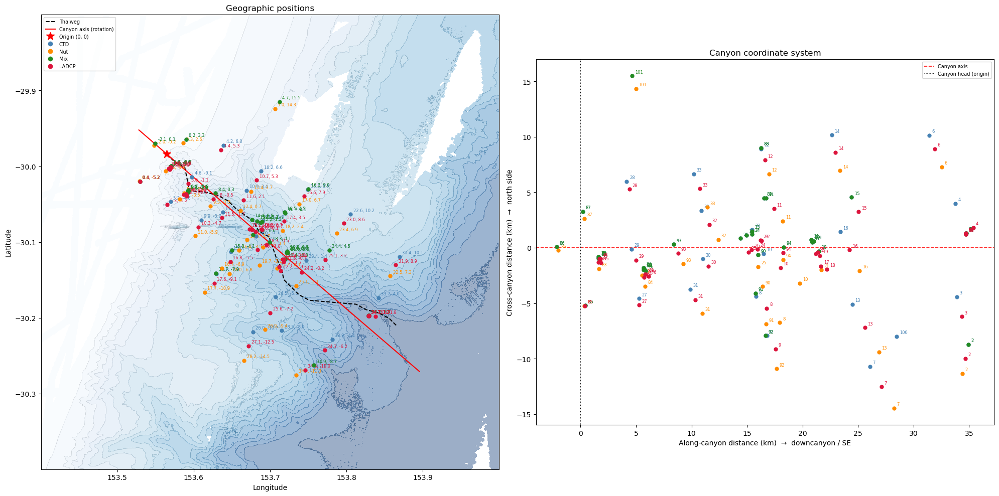

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# ── Instrument colours and labels ────────────────────────────────────────────
instrument_dicts = {
    'CTD':   sol_ctd,
    'Nut':   sol_nut,
    'Mix':   sol_mixing,
    'LADCP': sol_ladcp,
}
colours = {'CTD': 'steelblue', 'Nut': 'darkorange', 'Mix': 'forestgreen', 'LADCP': 'crimson'}

# ── Left panel: geographic map with canyon axis overlaid ─────────────────────
ax = axes[0]
ax.set_title('Geographic positions')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Bathymetry background
ax.contourf(lon_bathy, lat_bathy, bathy['Band1'].values, levels=20, cmap='Blues_r', alpha=0.4)
ax.contour( lon_bathy, lat_bathy, bathy['Band1'].values, levels=20, colors='k', linewidths=0.3, alpha=0.3)

# Thalweg
ax.plot(canyon_lons, canyon_lats, 'k--', linewidth=1.5, label='Thalweg')

# Canyon axis line through origin at CANYON_BEARING
# Extend +/- 30 km from origin for display
geod = Geodesic.WGS84
axis_pts = []
for d_m in np.linspace(-5000, 45000, 200):
    pt = geod.Direct(origin_lat, origin_lon, CANYON_BEARING, d_m)
    axis_pts.append((pt['lon2'], pt['lat2']))
axis_pts = np.array(axis_pts)
ax.plot(axis_pts[:, 0], axis_pts[:, 1], 'r-', linewidth=1.5, label='Canyon axis (rotation)')

# Mark origin
ax.plot(origin_lon, origin_lat, 'r*', markersize=12, zorder=5, label='Origin (0, 0)')

# Plot stations, coloured by instrument, annotated with (along, cross)
for name, cast_dict in instrument_dicts.items():
    for cast_num, ds in cast_dict.items():
        if isinstance(ds, pd.DataFrame):
            lat = ds['latitude'].iloc[0]
            lon = ds['longitude'].iloc[0]
            along = ds['along_canyon'].iloc[0]
            cross = ds['cross_canyon'].iloc[0]
        else:
            lat   = float(ds['latitude'])
            lon   = float(ds['longitude'])
            along = float(ds['along_canyon'])
            cross = float(ds['cross_canyon'])

        ax.plot(lon, lat, 'o', color=colours[name], markersize=5, zorder=4)
        ax.annotate(
            f'{along:.1f}, {cross:.1f}',
            xy=(lon, lat), xytext=(4, 4), textcoords='offset points',
            fontsize=6, color=colours[name]
        )

# Legend (instruments only, deduplicated)
for name, col in colours.items():
    ax.plot([], [], 'o', color=col, label=name)
ax.legend(fontsize=7, loc='upper left')

# ── Right panel: canyon coordinate space ─────────────────────────────────────
ax = axes[1]
ax.set_title('Canyon coordinate system')
ax.set_xlabel('Along-canyon distance (km)  →  downcanyon / SE')
ax.set_ylabel('Cross-canyon distance (km)  →  north side')
ax.axhline(0, color='r', linewidth=1.2, linestyle='--', label='Canyon axis')
ax.axvline(0, color='k', linewidth=0.8, linestyle=':',  label='Canyon head (origin)')

for name, cast_dict in instrument_dicts.items():
    for cast_num, ds in cast_dict.items():
        if isinstance(ds, pd.DataFrame):
            along = ds['along_canyon'].iloc[0]
            cross = ds['cross_canyon'].iloc[0]
        else:
            along = float(ds['along_canyon'])
            cross = float(ds['cross_canyon'])

        ax.plot(along, cross, 'o', color=colours[name], markersize=5, zorder=4)
        ax.annotate(
            str(cast_num),
            xy=(along, cross), xytext=(4, 4), textcoords='offset points',
            fontsize=6, color=colours[name]
        )

ax.legend(fontsize=7)
ax.set_aspect('equal')  # important: 1 km along = 1 km cross on the plot

plt.tight_layout()
plt.show()

In [22]:
# cut the bad LADCP data
for cast_num, ladcp_ds in sol_ladcp.items():
    if cast_num in sol_ctd:
        ctd_depth = np.nanmax(sol_ctd[cast_num].depth) + 10
        sol_ladcp[cast_num] = ladcp_ds.sel(z=slice(0,ctd_depth))

# Plotting Functions

In [23]:
def interpolate_thalweg(transect_profiles, variable, n_distance_points=10, n_depth_points=100):
    # Step 1: Extract cross-canyon distances
    distances = [profile.along_canyon.mean().item() for profile in transect_profiles]

    # Step 2: Create a common depth grid (e.g. from surface to deepest profile)
    all_depths = np.concatenate([profile.depth.values for profile in transect_profiles])
    depth_grid = np.linspace(np.nanmin(all_depths), np.nanmax(all_depths), n_depth_points)

    # Step 3: Interpolate each profile to the common depth grid
    interpolated_vars = []
    for profile in transect_profiles:
        depth = profile.depth.values
        var = profile[variable].values.flatten()
        sort_idx = np.argsort(depth)
        depth_sorted = depth[sort_idx]
        var_sorted = var[sort_idx]
        interp_var = np.interp(depth_grid, depth_sorted, var_sorted, left=np.nan, right=np.nan)
        interpolated_vars.append(interp_var)


    # Step 4: Build DataArray (distance × depth)
    all_var = np.array(interpolated_vars)
    var_array = xr.DataArray(
        all_var,
        dims=['distance', 'depth'],
        coords={'distance': distances, 'depth': depth_grid}
    )

    # Step 6: Interpolate along distance
    distance_grid = np.linspace(min(distances), max(distances), n_distance_points)
    var_transect = var_array.interp(distance=distance_grid, method='linear')

    # Step 7: Return Dataset
    transect_ds = xr.Dataset(
        {variable: var_transect},
        coords={
            'depth': var_transect.depth,
            'distance': var_transect.distance
        }
    )

    return transect_ds

In [24]:
def extract_bathymetry_profile(bathy_ds, solitary_datasets, 
                               direction,
                               high_res_samples=100):

    # Extract CTD coordinates and distances
    Castdata = []
    for dataset in solitary_datasets:
        Castlongitude = dataset['longitude'].item()
        Castlatitude = dataset['latitude'].item()
        distance = dataset[direction].item()  # Use specified direction
        Castdepth = dataset['depth'].values.min()
        
        Castdata.append({
            'latitude': Castlatitude,
            'longitude': Castlongitude,
            'distance': distance,
            'Castdepth': Castdepth
        })
    
    # Sort by distance
    Castdata = sorted(Castdata, key=lambda x: x['distance'])
    Castdistances = np.array([d['distance'] for d in Castdata])

    # Adjust coordinates where bathymetry is too shallow
    for d in Castdata:
        latitude = d['latitude']
        longitude = d['longitude']
        
        if bathy_ds['Band1'].sel(lat=latitude, lon=longitude, method='nearest') > d['Castdepth']:
            search_radius = 100
            found = False
            
            # Keep expanding search radius until we find deep enough water
            while not found and search_radius <= 10000:  # Increased max limit
                radius_deg = search_radius / 111000
                search_ds = bathy_ds.sel(
                    lat=slice(latitude - radius_deg, latitude + radius_deg),
                    lon=slice(longitude - radius_deg, longitude + radius_deg)
                )
                
                if search_ds.Band1.min() <= d['Castdepth']:
                    # Found deep enough water
                    new_ds = search_ds.where(search_ds.Band1 == search_ds.Band1.min(),drop=True)
                    new_longitude = new_ds.longitude.values[~np.isnan(new_ds.longitude.values)][0]
                    new_latitude = new_ds.latitude.values[~np.isnan(new_ds.latitude.values)][0]
                    
                    # Update the dictionary with new coordinates
                    d['longitude'] = new_longitude
                    d['latitude'] = new_latitude
                    found = True
                else:
                    search_radius += 100
            
            # If we never found deep enough water, keep original coordinates
            if not found:
                print(f"Warning: Could not find bathymetry <= {d['Castdepth']}m within 10km of ({latitude}, {longitude})")

    
    # Create high-resolution sampling alongitudeg the transect
    min_dist = min(Castdistances)
    max_dist = max(Castdistances)
    
    # Generate high-resolution distances
    high_res_distances = np.linspace(min_dist, max_dist, high_res_samples)
    
    # Use UPDATED latitude/longitude coordinates for interpolatitudeion
    Castlatitudes = np.array([d['latitude'] for d in Castdata])
    Castlongitudes = np.array([d['longitude'] for d in Castdata])
    
    # Interpolatitudee to get latitude/longitude at high-resolution distances
    latitude_interp = interp1d(Castdistances, Castlatitudes, kind='linear', 
                         bounds_error=False, fill_value='extrapolatitudee')
    longitude_interp = interp1d(Castdistances, Castlongitudes, kind='linear',
                         bounds_error=False, fill_value='extrapolatitudee')
    
    high_res_latitudes = latitude_interp(high_res_distances)
    high_res_longitudes = longitude_interp(high_res_distances)
    
    # Extract bathymetry at high-resolution points
    seafloor_depths = []
    for latitude, longitude in zip(high_res_latitudes, high_res_longitudes):
        try:
            depth = bathy_ds['Band1'].sel(lat=latitude, lon=longitude, method='nearest')
            seafloor_depths.append(depth.item())
        except:
            # Handle points outside bathymetry grid
            seafloor_depths.append(np.nan)
    
    seafloor_depths =-1*np.array(seafloor_depths)
    
    return high_res_distances, seafloor_depths, Castdistances

In [25]:
def proj_vels(ds, angle):
    theta_rad = np.radians(angle)

    u = ds['u'].values  # eastward velocity (depth,) or (time, depth) etc.
    v = ds['v'].values  # northward velocity

    # Define alongshore and cross-shore unit vectors
    cos_theta = np.cos(theta_rad)
    sin_theta = np.sin(theta_rad)
    
    # Project velocities using rotation matrix approach
    # Alongshore: component in direction of angle
    v_along = u * cos_theta + v * sin_theta
    
    # Cross-shore: component perpendicular to alongshore (90° counter-clockwise)
    v_cross = -u * sin_theta + v * cos_theta
    
    return v_cross, v_along

In [26]:
def calc_shear_mag(ds):

    du_dz = ds['u'].differentiate('depth') 
    dv_dz = ds['v'].differentiate('depth')

    total_shear = du_dz**2 + dv_dz**2
    #shear=np.sqrt(total_shear)
    
    return total_shear

def plot_transect_vel(ax,datasets,vel_dir, direction,rotation_angle=65, vmin=-0.7, vmax=0.7):

    
    # Plot velocity data
    for ds in datasets:
        dist = ds[direction].values.item()
        depths = ds['depth'].values
        u_values, v_values = proj_vels(ds, rotation_angle)

        if vel_dir=='cross':
            col=pd.Series(u_values).rolling(window=10,center=True).mean()
        elif vel_dir == 'along':
            col=pd.Series(v_values).rolling(window=10,center=True).mean()
        sc = ax.scatter([dist] * len(depths), depths, c=col, 
                       cmap='cmo.balance', s=300, vmin=vmin, vmax=vmax, zorder=3)
        # Extract bathymetry
    cross_distances, seafloor, Castdistances = extract_bathymetry_profile(bathy,datasets, direction,high_res_samples=100)

    max_depth = np.nanmax([np.nanmax(-1 *ds.depth.values) for ds in datasets] + [np.nanmax(seafloor)])
    ax.fill_between(cross_distances, max_depth,seafloor, color='grey', zorder=1)
    ax.plot(cross_distances, seafloor, 'k-', linewidth=2)
    
    # Formatting
    ax.set_xlabel('Distance (km)', fontsize=16)
    ax.set_ylabel('Depth (m)', fontsize=16)
    ax.set_xlim([min(cross_distances) - 1, max(cross_distances) + 1])
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.invert_yaxis() 

    if vel_dir=='cross':
        plt.colorbar(sc, ax=ax, extend='both',label=r'Cross-shore velocity (ms$^{-1}$)')
    elif vel_dir == 'along':
        plt.colorbar(sc, ax=ax,extend='both', label=r'Along-shore velocity (ms$^{-1}$)')
    
    return  sc

def plot_transect_shear(ax,datasets, direction,vmin=0, vmax=1):

    # Plot velocity data
    for ds in datasets:
        dist = ds[direction].values.item()
        
        shear = calc_shear_mag(ds)
        #val=shear.values
        val=pd.Series(shear.values).rolling(window=10,center=True).mean()
        depths= shear.depth.values
        
        sc = ax.scatter([dist] * len(depths), depths, c=val*1e4, 
                       cmap='cmo.amp', s=300, vmin=vmin, vmax=vmax, zorder=3)
    # Extract bathymetry
    cross_distances, seafloor, Castdistances = extract_bathymetry_profile(bathy, datasets, direction,high_res_samples=100)
            # Bathymetry
    max_depth = np.nanmax([np.nanmax(ds.depth.values) for ds in datasets] + [np.nanmax(seafloor)])
    ax.fill_between(cross_distances, max_depth,seafloor, color='grey', zorder=1)
    ax.plot(cross_distances, seafloor, 'k-', linewidth=2)
    
    # Formatting
    ax.set_xlabel('Distance (km)', fontsize=16)
    ax.set_ylabel('Depth (m)', fontsize=16)
    ax.set_xlim([min(cross_distances) - 1, max(cross_distances) + 1])
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.invert_yaxis() 

    
    plt.colorbar(sc, ax=ax, extend='max',label=r'$S^2$ ($\times 10^{-4}$ s$^{-2}$)')
    
    return sc

In [27]:
def calc_shear_sq(ds):

    du_dz = ds['u'].differentiate('depth') 
    dv_dz = ds['v'].differentiate('depth')

    shear = du_dz**2 + dv_dz**2

    return shear

def calc_richardson(ds_vel, ds_mix,var):
    # Find the common depth range across all datasets
    min_depth = min(ds['depth'].min() for ds in ds_vel)
    max_depth = max(ds['depth'].max() for ds in ds_vel)
    
    # Also check ds_mix depth range to ensure proper overlap
    min_depth = min(min_depth, min(ds['depth'].min() for ds in ds_mix))
    max_depth = max(max_depth, max(ds['depth'].max() for ds in ds_mix))

    bin_size = 10
    depth_bins = np.arange(min_depth, max_depth + bin_size, bin_size)
    depth_centers = (depth_bins[:-1] + depth_bins[1:]) / 2

    binned_datasets = []
    for i in range(len(ds_vel)): 
        shear = calc_shear_sq(ds_vel[i])

        shear_df = pd.DataFrame({'depth': shear.depth.values,'shear': (shear.values)})
        mix_df = pd.DataFrame({'depth': ds_mix[i]['depth'],'N2': ds_mix[i]['N2'],var:np.log10(ds_mix[i][var])})

        binned_mix = mix_df.groupby(pd.cut(mix_df['depth'], depth_bins)).mean().reset_index(drop=True)
        binned_shear = shear_df.groupby(pd.cut(shear_df['depth'], depth_bins)).mean().reset_index(drop=True)

        binned_mix["depth_bins"] = depth_centers
        binned_shear["depth_bins"] = depth_centers
        
        binned_all = pd.merge(binned_mix, binned_shear, on='depth_bins').dropna()

        binned_all['Ri'] = binned_all['N2'] / binned_all['shear']

        min_shear_threshold = 1e-7 
        binned_all['Ri'] = np.where(
            binned_all['shear'] > min_shear_threshold,
            binned_all['N2']/binned_all['shear'] ,
            np.nan 
        )

        binned_datasets.append(binned_all)
    
    return binned_datasets

In [28]:
def plot_depth_scatter(dataset, depth, variable, vbounds, highlight_casts, cmap, ax):
    normal_lons, normal_lats, normal_vars = [], [], []
    highlight_lons, highlight_lats, highlight_vars = [], [], []

    for cast, ds in dataset.items():
        try:
            var = ds.sel(depth=depth, method='nearest', tolerance=5)[variable].item()
            lats = ds.latitude.item()
            lons = ds.longitude.item()

            if int(cast) in highlight_casts:
                highlight_lons.append(lons)
                highlight_lats.append(lats)
                highlight_vars.append(var)
            else:
                normal_lons.append(lons)
                normal_lats.append(lats)
                normal_vars.append(var)
        except:
            pass

    points = ax.scatter(normal_lons, normal_lats, c=normal_vars, cmap=cmap,
                        s=500, vmin=vbounds[0], vmax=vbounds[1], marker='o')

    if highlight_lons:
        ax.scatter(highlight_lons, highlight_lats, c=highlight_vars, cmap=cmap,
                   s=1000, vmin=vbounds[0], vmax=vbounds[1], marker='*')

    cbar = plt.colorbar(points, extend='both')
    cbar.set_label('Temperature ($^\circ$C)')

    return points, cbar

In [29]:
def plot_transect(datasets, variable, bathy, direction,ax, vmin=7, vmax=23):


    # Extract bathymetry
    cross_distances, seafloor, Castdistances = extract_bathymetry_profile(
        bathy,datasets, direction)
    
    # Plot velocity data
    for ds in datasets:
        dist = ds[direction].values.item()
        depths = ds['depth'].values
        var_values = ds[variable].values
        

        sc= ax.scatter([dist] * len(depths), depths, c=var_values, cmap='cmo.thermal',s=300, vmin=vmin, vmax=vmax, zorder=3)

    # Bathymetry
    max_depth = np.nanmax(seafloor)
    ax.fill_between(cross_distances, seafloor, max_depth, color='grey', zorder=1)
    ax.plot(cross_distances, seafloor, 'k-', linewidth=2)
    
    # Formatting
    ax.set_xlabel('Distance (km)', fontsize=16)
    ax.set_ylabel('Depth (m)',fontsize=16)
    ax.set_xlim([min(cross_distances) - 1, max(cross_distances) + 1])
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.invert_yaxis()
    cbar = plt.colorbar(sc, ax=ax,extend='both')
    cbar.set_label('Temperature ($^\circ$C)')
    
    return fig, ax, sc

In [30]:
def calculate_strain(dataset, depth_idx, grid_size=45):
    # Extract clean data at depth
    ds = dataset.set_coords(['lon', 'lat']).where(
        ~np.isnan(dataset.u.isel(depth_cell=depth_idx)), drop=True
    )
    
    u, v = ds.u.isel(depth_cell=depth_idx).values, ds.v.isel(depth_cell=depth_idx).values
    lats, lons = ds.lat.values, ds.lon.values
    
    # Define grid and conversion factors
    lat_grid = np.linspace(lats.min(), lats.max(), grid_size)
    lon_grid = np.linspace(lons.min(), lons.max(), grid_size)
    lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
    
    m_per_deg_lat = 111320
    m_per_deg_lon = 111320 * np.cos(np.radians(np.mean(lats)))
    dlat, dlon = np.diff(lat_grid)[0] * m_per_deg_lat, np.diff(lon_grid)[0] * m_per_deg_lon
    
    # Grid velocities
    u_grid = griddata((lons, lats), u, (lon_mesh, lat_mesh), method='linear')
    v_grid = griddata((lons, lats), v, (lon_mesh, lat_mesh), method='linear')
    
    # Calculate strain components
    dv_dx, du_dy = np.gradient(v_grid, dlon, axis=1), np.gradient(u_grid, dlat, axis=0)
    du_dx, dv_dy = np.gradient(u_grid, dlon, axis=1), np.gradient(v_grid, dlat, axis=0)
    
    shear_strain = dv_dx + du_dy
    normal_strain = du_dx - dv_dy
    
    # Interpolate back to original points
    points = np.column_stack([lats, lons])
    interp_kwargs = {'method': 'linear', 'bounds_error': False, 'fill_value': np.nan}
    
    shear_at_points = RegularGridInterpolator(
        (lat_grid, lon_grid), shear_strain, **interp_kwargs
    )(points)
    
    strain_at_points = RegularGridInterpolator(
        (lat_grid, lon_grid), normal_strain, **interp_kwargs
    )(points)
    
    return {
        'u': u, 'v': v, 'lats': lats, 'lons': lons,
        'u_grid': u_grid, 'v_grid': v_grid,
        'lon_mesh': lon_mesh, 'lat_mesh': lat_mesh,
        'shear_at_points': shear_at_points,
        'strain_at_points': strain_at_points
    }

def calculate_vorticity(dataset, depth_idx, grid_size=45):
    # Extract clean data at depth
    ds = dataset.set_coords(['lon', 'lat']).where(
        ~np.isnan(dataset.u.isel(depth_cell=depth_idx)), drop=True
    )
    
    u, v = ds.u.isel(depth_cell=depth_idx).values, ds.v.isel(depth_cell=depth_idx).values
    lats, lons = ds.lat.values, ds.lon.values
    
    # Define grid and conversion factors
    lat_grid = np.linspace(lats.min(), lats.max(), grid_size)
    lon_grid = np.linspace(lons.min(), lons.max(), grid_size)
    lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
    
    m_per_deg_lat = 111320
    m_per_deg_lon = 111320 * np.cos(np.radians(np.mean(lats)))
    dlat, dlon = np.diff(lat_grid)[0] * m_per_deg_lat, np.diff(lon_grid)[0] * m_per_deg_lon
    
    # Grid velocities
    u_grid = griddata((lons, lats), u, (lon_mesh, lat_mesh), method='linear')
    v_grid = griddata((lons, lats), v, (lon_mesh, lat_mesh), method='linear')
    
    # Calculate strain components
    dv_dx, du_dy = np.gradient(v_grid, dlon, axis=1), np.gradient(u_grid, dlat, axis=0)
    
    vorticity = dv_dx - du_dy
    # Interpolate vorticity back to original locations
    vorticity_interp = RegularGridInterpolator(
        (lat_grid, lon_grid), 
        vorticity, 
        method='linear',
        bounds_error=False,
        fill_value=np.nan
    )
    
    # Get vorticity at original data points
    points_original = np.column_stack([lats, lons])
    vorticity_at_points = vorticity_interp(points_original)

    rossby_at_points = vorticity_at_points / np.abs(f)
    
    return {
        'u': u,
        'v': v,
        'lats': lats,
        'lons': lons,
        'u_grid': u_grid,
        'v_grid': v_grid,
        'lon_mesh': lon_mesh,
        'lat_mesh': lat_mesh,
        'vorticity_grid': vorticity,
        'vorticity_at_points': vorticity_at_points,
        'rossby_at_points': rossby_at_points
    }


In [48]:
def create_subplot_split(ax, title, adcp_data, depth_idx, plot_type):
    """Create subplot with either quiver or vorticity."""
    # Add title
    ax.text(0.025, 1.05, title, transform=ax.transAxes, fontsize=18, 
            va='top', fontweight='bold')
    
    # Bathymetry contour
    seafloor=ax.contourf(lon_bathy, lat_bathy, -1*bathy.Band1.values, 
                levels=np.arange(0,4500, 500), cmap='Greys')
    
    scatter = None
    Qsmall = None  # Initialize here
    Qlarge = None  # Initialize here
    
    if plot_type == 'vorticity':
        # Rossby number scatter
        result = calculate_vorticity(adcp_data, depth_idx=depth_idx)
        scatter = ax.scatter(result['lons'], result['lats'], 
                        c=result['rossby_at_points'],
                        cmap='cmo.balance', s=100, vmin=-2, vmax=2,
                        edgecolors='k', linewidth=0.5)
    
    elif plot_type == 'quiver':
        # Velocity quivers
        lon = np.array([adcp_data.lon[i].item() for i in range(len(adcp_data.lon))])
        lat = np.array([adcp_data.lat[i].item() for i in range(len(adcp_data.lat))])
        u = np.array([adcp_data.u[i].values[depth_idx] for i in range(len(adcp_data.lon))])
        v = np.array([adcp_data.v[i].values[depth_idx] for i in range(len(adcp_data.lon))])
        
        # Create mask for large velocities
        large = np.abs(v) > 0.2
        
        # Plot quivers
        Qlarge=ax.quiver(lon[large][::10], lat[large][::10], u[large][::10], v[large][::10], 
                 scale=6, width=0.006, color='midnightblue', edgecolor='black', linewidth=0.5)
        Qsmall=ax.quiver(lon[~large], lat[~large], u[~large], v[~large], 
                 scale=2, width=0.004, color='lightskyblue', edgecolor='black', linewidth=0.5)
    
    # Set limits and gridlines
    ax.set_xlim([153.55, 153.7])
    ax.set_ylim([-30.1, -29.95])
    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.2, linestyle='--')
    gl.right_labels = gl.top_labels = False
    gl.left_labels = gl.bottom_labels = True
    
    return scatter, seafloor, Qsmall, Qlarge


In [32]:
def calculate_vorticity_slice(dataset, lon_slice, lat_slice,depth_idx, grid_size=45):
    # Extract clean data at depth
    ds = dataset.set_coords(['lon', 'lat']).where(
        ~np.isnan(dataset.u.isel(depth_cell=depth_idx)), drop=True
    )
    
    u, v = ds.u.isel(depth_cell=depth_idx).values, ds.v.isel(depth_cell=depth_idx).values
    lats, lons = ds.lat.values, ds.lon.values
    
    # Define grid and conversion factors
    lat_grid = np.linspace(lats.min(), lats.max(), grid_size)
    lon_grid = np.linspace(lons.min(), lons.max(), grid_size)
    lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
    
    m_per_deg_lat = 111320
    m_per_deg_lon = 111320 * np.cos(np.radians(np.mean(lats)))
    dlat, dlon = np.diff(lat_grid)[0] * m_per_deg_lat, np.diff(lon_grid)[0] * m_per_deg_lon
    
    # Grid velocities
    u_grid = griddata((lons, lats), u, (lon_mesh, lat_mesh), method='linear')
    v_grid = griddata((lons, lats), v, (lon_mesh, lat_mesh), method='linear')
    
    # Calculate strain components
    dv_dx, du_dy = np.gradient(v_grid, dlon, axis=1), np.gradient(u_grid, dlat, axis=0)
    du_dx, dv_dy = np.gradient(u_grid, dlon, axis=1), np.gradient(v_grid, dlat, axis=0)
    
    
    vorticity = dv_dx - du_dy
    shear_strain = dv_dx + du_dy
    normal_strain = du_dx - dv_dy

        # Interpolate back to original points
    points = np.column_stack([lat_slice, lon_slice])
    interp_kwargs = {'method': 'linear', 'bounds_error': False, 'fill_value': np.nan}
    
    shear_at_points = RegularGridInterpolator(
        (lat_grid, lon_grid), shear_strain, **interp_kwargs
    )(points)
    
    strain_at_points = RegularGridInterpolator(
        (lat_grid, lon_grid), normal_strain, **interp_kwargs
    )(points)

    vorticity_at_points = RegularGridInterpolator(
        (lat_grid, lon_grid), vorticity, **interp_kwargs
    )(points)


    rossby_at_points = vorticity_at_points / np.abs(f)
    
    return {
        'u': u, 'v': v, 'lats': lat_slice, 'lons': lon_slice,
        'u_grid': u_grid, 'v_grid': v_grid,
        'lon_mesh': lon_mesh, 'lat_mesh': lat_mesh,
        'shear_at_points': shear_at_points/ np.abs(f),
        'strain_at_points': strain_at_points/ np.abs(f),
        'rossby_at_points': rossby_at_points,
        'vorticity_at_points': vorticity_at_points
    }

In [33]:
def calc_shear_slice(ds):
    u = ds['u']
    v = ds['v']
    depth = ds['depth'] 

    du_dz = u.differentiate('depth_cell') / depth.differentiate('depth_cell')
    dv_dz = v.differentiate('depth_cell') / depth.differentiate('depth_cell')

    total_shear = du_dz**2 + dv_dz**2
    
    return total_shear

# Figure 1

Schematic features were hand drawn

<Figure size 640x480 with 0 Axes>

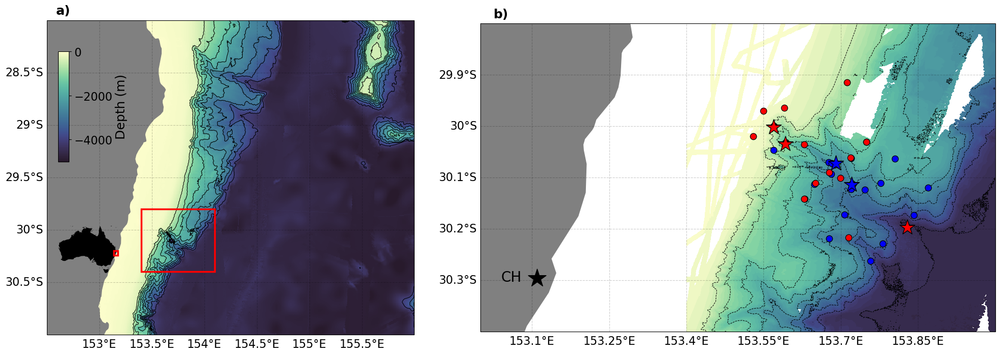

In [25]:

# Define the list of variable names to be plotted with a red outline
gs = gridspec.GridSpec(nrows=1,ncols=2,wspace=0.15, hspace=0.2,width_ratios=[1,1.4])
plt.cla()
plt.clf()
fig = plt.figure(figsize=[24,10])#what is this?
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='16'
plt.rcParams['ytick.labelsize']='16'
ax = None

ax = fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree())
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.set_extent([152.5, 156, -31, -28])
Coast = cfeature.NaturalEarthFeature(category='physical',scale='10m',facecolor='none', name='coastline')
feature = ax.add_feature(Coast, edgecolor='gray',facecolor='gray') 
im = ax.pcolormesh(bathy_large.lon,bathy_large.lat,bathy_large.elevation,cmap='cmo.deep_r',zorder=1)
ax.contour(bathy_large.lon,bathy_large.lat,bathy_large.elevation,levels=np.arange(-4050,-50,500),colors='k',linewidths=.75,linestyles='solid',zorder=2)
im.set_clim(-5000,0)

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True

ax2 = fig.add_axes([0.11, 0.3, 0.1, 0.1],projection=ccrs.PlateCarree())
ax2.add_feature(cfeature.LAND,facecolor='k')
ax2.set_extent([113, 157, -44, -10.4])
ax2.set_axis_off()
ax2.patch.set_alpha(0.0)
ax2.add_patch(Rectangle((152,-31),3,3, 
                        fill=False, linewidth=2.5,
                        #alpha=0.1,
                       color="red",zorder=5))

ax.add_patch(Rectangle((153.4,-30.4),0.7,0.6, 
                        fill=False, linewidth=2.5,
                       color="red",zorder=5))

cax = inset_axes(ax,
            width="3%",  # width = 10% of parent_bbox width
            height="50%",  # height : 50%
            loc='lower left',
            bbox_to_anchor=(.03,.55, 1, .7),
            bbox_transform=ax.transAxes,
            borderpad=0.03,
            )
cbar = fig.colorbar(im, cax=cax, orientation="vertical")
cbar.set_label('Depth (m)',fontsize=18)

ax = fig.add_subplot(gs[0,1],projection=ccrs.PlateCarree())
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.set_extent([153, 154, -30.4, -29.8])
contour = ax.contour(lon_bathy, lat_bathy, bathy_data, levels=10,colors='black', linewidths=0.7, zorder=1)

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True

contour_filled = ax.contourf(lon_bathy, lat_bathy, bathy_data, levels=45,cmap='cmo.deep_r', zorder=0,vmin=-5000,vmax=0)
feature = ax.add_feature(Coast, edgecolor='gray',facecolor='gray')
plt.scatter(x=[153.11], y=[-30.296], marker='*',
            color="black",s=700, zorder=6,
            transform=ccrs.PlateCarree())
ax.text(0.04, 0.2, 'CH', transform=ax.transAxes,fontsize=20, va='top')

#change colour to inshore vs offshore
#make another shape for mxing? only mixing?

for ds in sol1_ctd.values():
    sc = ax.scatter(ds.longitude.item(), ds.latitude.item(),
                    c='blue', s=80, edgecolor='k', linewidth=0.9, zorder=5, marker='o')
for ds in sol2_ctd.values():
    sc = ax.scatter(ds.longitude.item(), ds.latitude.item(),
                    c='red', s=80, edgecolor='k', linewidth=0.9, zorder=5, marker='o')

yoyo_lons_1=[153.569489,153.59246826171875,153.8286895751953]
yoyo_lats_1=[-30.001893997192383,-30.034740447998047,-30.197383880615234]
yoyo_lons_2=[153.69017028808594,153.7214813232422]
yoyo_lats_2=[-30.072357177734375,-30.11408805847168]


ax.scatter(yoyo_lons_1,yoyo_lats_1,c='red',s=500,zorder=6,marker='*', edgecolor='k')
ax.scatter(yoyo_lons_2,yoyo_lats_2,c='blue',s=500,zorder=6,marker='*', edgecolor='k')

plt.show()

# Figure 2

In [205]:
IMOS=xr.open_dataset("C:/Users/uqmjef10/OneDrive - The University of Queensland/Documents/PhD/data/IMOS_aggregation_20241212T001402Z.nc")
SST=xr.open_dataset("C:/Users/uqmjef10/OneDrive - The University of Queensland/Documents/PhD/data/IMOS_aggregation_20250902T025408Z/IMOS_aggregation_20250902T025408Z.nc")


In [206]:
solitary1_vel=IMOS.sel(TIME=slice('2024-06-09','2024-06-16'))
solitary2_vel=IMOS.sel(TIME=slice('2024-06-24','2024-06-29'))

solitary1_sst=SST.sel(time=slice('2024-06-09','2024-06-16'))
solitary2_sst=SST.sel(time=slice('2024-06-24','2024-06-29'))

solitary1_sst['sst']=solitary1_sst.analysed_sst-273.15
solitary2_sst['sst']=solitary2_sst.analysed_sst-273.15

In [207]:
# Make line
lon0, lat0 = 153.73, -30.13  # change as needed


# Angle in degrees counterclockwise from east
theta_deg = 325  
theta_rad = np.radians(theta_deg)

# Length of line in degrees (adjust for visibility)
length = 0.2 # degrees — can be small (~0.1) or large

# Compute delta lon/lat
delta_lon = length * np.cos(theta_rad)
delta_lat = length * np.sin(theta_rad)

# Create line endpoints
lon_line_points = [lon0 - delta_lon, lon0 + delta_lon]
lat_line_points = [lat0 - delta_lat, lat0 + delta_lat]

In [208]:
solitary1_vel["speed"]=np.sqrt(solitary1_vel.UCUR.mean(dim='TIME')**2 +solitary1_vel.VCUR.mean(dim='TIME')**2)
solitary2_vel["speed"]=np.sqrt(solitary2_vel.UCUR.mean(dim='TIME')**2 +solitary2_vel.VCUR.mean(dim='TIME')**2)

In [209]:
sol1_thal = [sol_ladcp[29], sol_ladcp[30], sol_ladcp[23], sol_ladcp[18], sol_ladcp[4]]
sol2_thal = [sol_ladcp[75], sol_ladcp[76], sol_ladcp[93], sol_ladcp[94], sol_ladcp[95]]

In [210]:
for key, dataset in sol_ladcp.items():
    
    cross_canyon, along_canyon = proj_vels(dataset,70)
    
    sol_ladcp[key]['cross_shore'] = cross_canyon
    sol_ladcp[key]['along_shore'] = along_canyon

<Figure size 640x480 with 0 Axes>

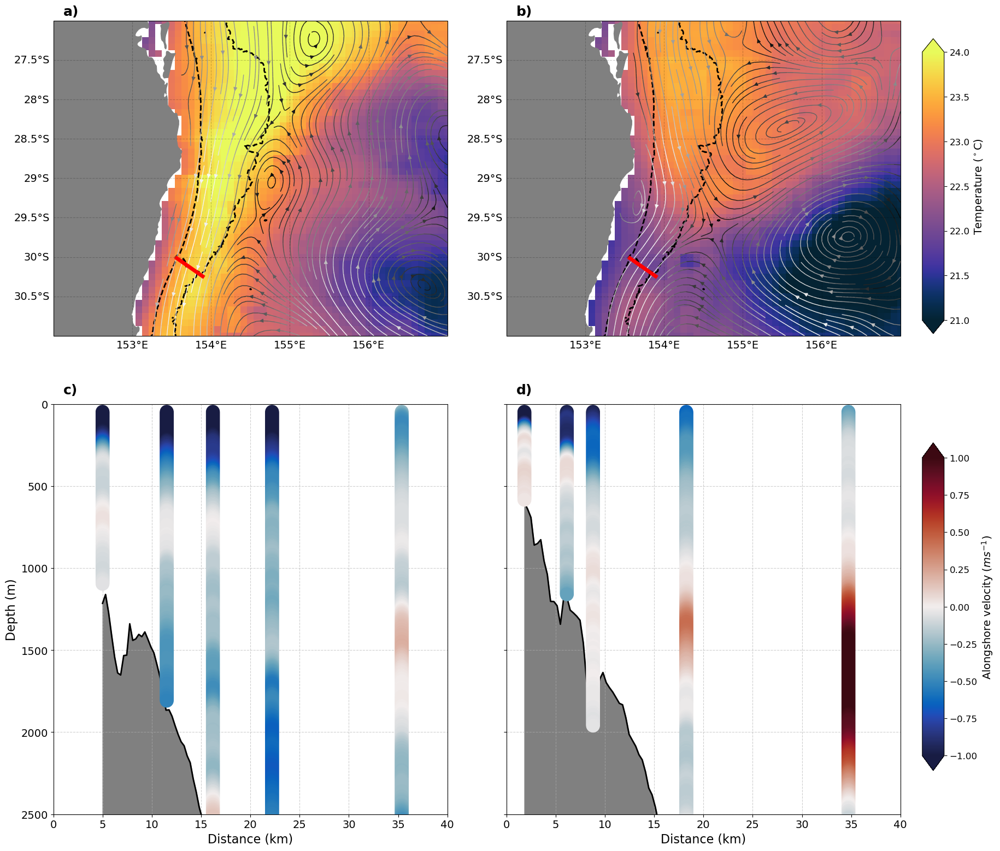

In [46]:
gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.15, hspace=0.05)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[20,20])#what is this?
ax = None
plt.rcParams['font.size'] = '14'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

str_kwargs = {"color":solitary1_vel.speed.values,
              "linewidth":1,
              "arrowsize":1,
              "density":2,
              "cmap":"Greys_r",
             "transform":ccrs.PlateCarree()}

pcol_kwargs = {"cmap":"cmo.speed"}

ax = fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree())
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.set_extent([152, 157, -31, -27])
Coast = cfeature.NaturalEarthFeature(category='physical',scale='10m',facecolor='none', name='coastline')
feature = ax.add_feature(Coast, edgecolor='gray',facecolor='gray')
im = ax.pcolormesh(solitary1_sst.lon.values,solitary1_sst.lat.values,solitary1_sst.sst.mean(dim="time").values,cmap='cmo.thermal',zorder=1)
im.set_clim(21,24)
st = ax.streamplot(solitary1_vel.LONGITUDE.values, solitary1_vel.LATITUDE.values, solitary1_vel.UCUR.mean(dim='TIME').values, solitary1_vel.VCUR.mean(dim='TIME').values,**str_kwargs,zorder=2)
contour = ax.contour(bathy_large.lon.sel(lon=slice(153,154.8)), bathy_large.lat, bathy_large['elevation'].sel(lon=slice(153,154.8)), levels=[-4200,-200],colors='black', linewidths=2, zorder=1)
plt.plot(lon_line_points, lat_line_points, 'r-', linewidth=5, zorder=3)

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True


ax = fig.add_subplot(gs[0,1],projection=ccrs.PlateCarree())
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.set_extent([152, 157, -31, -27])
feature = ax.add_feature(Coast, edgecolor='gray',facecolor='gray')
im = ax.pcolormesh(solitary2_sst.lon.values,solitary2_sst.lat.values,solitary2_sst.sst.mean(dim="time").values,cmap='cmo.thermal',zorder=1)
im.set_clim(21,24)
st = ax.streamplot(solitary2_vel.LONGITUDE.values, solitary2_vel.LATITUDE.values, solitary2_vel.UCUR.mean(dim='TIME').values, solitary2_vel.VCUR.mean(dim='TIME').values,**str_kwargs,zorder=2)
contour = ax.contour(bathy_large.lon.sel(lon=slice(153,154.8)), bathy_large.lat, bathy_large['elevation'].sel(lon=slice(153,154.8)), levels=[-4200,-200],colors='black', linewidths=2, zorder=1)
plt.plot(lon_line_points, lat_line_points, 'r-', linewidth=5, zorder=3)

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True

cbar_ax = fig.add_axes([0.92, 0.55, 0.02, 0.27])  # Adjust this to position the colorbar
cbar = fig.colorbar(im, cax=cbar_ax,extend='both')
cbar.set_label('Temperature ($^\circ$C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

ax=fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
# Plot velocity data
for ds in sol1_thal:
    dist = ds['along_canyon'].values.item()
    depths = ds['depth'].values
    u_values, v_values = proj_vels(ds, 70)


    col=pd.Series(v_values).rolling(window=10,center=True).mean()
    sc = ax.scatter([dist] * len(depths), depths, c=col, 
                    cmap='cmo.balance', s=300, vmin=-1, vmax=1, zorder=3)

seafloor_dist,seafloor_depth,_=extract_bathymetry_profile(bathy, sol1_thal,'along_canyon')
max_depth = np.nanmax(seafloor_depth)
ax.fill_between(seafloor_dist, seafloor_depth, max_depth, color='grey', zorder=1)
ax.plot(seafloor_dist, seafloor_depth, 'k-', linewidth=2)

# Formatting
ax.set_xlabel('Distance (km)', fontsize=16)
ax.set_ylabel('Depth (m)',fontsize=16)

ax.grid(True, linestyle='--', alpha=0.6)
ax.set_ylim(2500,0)
ax.set_xlim(0,40)
#plt.colorbar(pcm, ax=ax, label='Velocity (m/s)')

ax=fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')

for ds in sol2_thal:
    dist = ds['along_canyon'].values.item()
    depths = ds['depth'].values
    u_values, v_values = proj_vels(ds, 70)


    col=pd.Series(v_values).rolling(window=10,center=True).mean()
    sc = ax.scatter([dist] * len(depths), depths, c=col, 
                    cmap='cmo.balance', s=300, vmin=-1, vmax=1, zorder=3)


seafloor_dist,seafloor_depth,_=extract_bathymetry_profile(bathy, sol2_thal,'along_canyon')
max_depth = np.nanmax(seafloor_depth)
ax.fill_between(seafloor_dist, seafloor_depth, max_depth, color='grey', zorder=1)
ax.plot(seafloor_dist, seafloor_depth, 'k-', linewidth=2)

# Formatting
ax.set_xlabel('Distance (km)', fontsize=16)

ax.grid(True, linestyle='--', alpha=0.6)
ax.set_ylim(2500,0)
ax.set_xlim(0,40)


ax.set_yticklabels([])

cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.3])  # Adjust this to position the colorbar
cbar2 = fig.colorbar(sc, cax=cbar_ax2,extend='both')
cbar2.set_label('Alongshore velocity ($ms^{-1}$)', fontsize=14)
cbar2.ax.tick_params(labelsize=12)

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3650923206.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

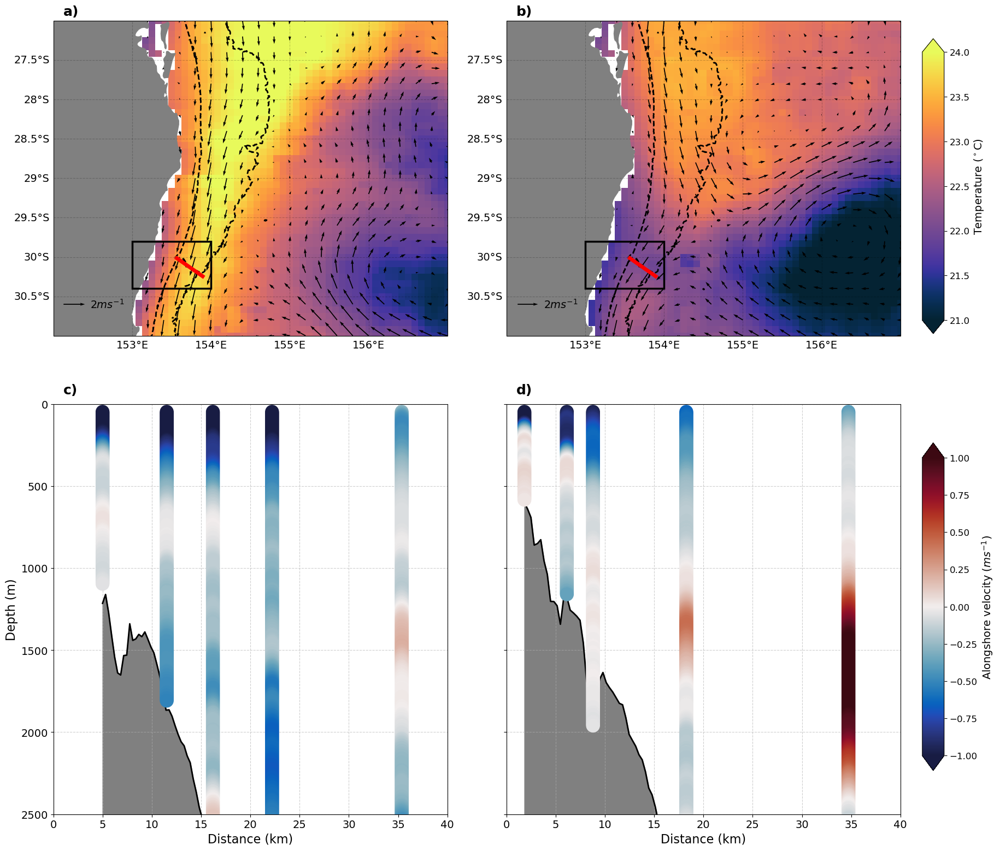

In [226]:
gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.15, hspace=0.05)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[20,20])#what is this?
ax = None
plt.rcParams['font.size'] = '14'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'



ax = fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree())
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.set_extent([152, 157, -31, -27])
Coast = cfeature.NaturalEarthFeature(category='physical',scale='10m',facecolor='none', name='coastline')
feature = ax.add_feature(Coast, edgecolor='gray',facecolor='gray')
im = ax.pcolormesh(solitary1_sst.lon.values,solitary1_sst.lat.values,solitary1_sst.sst.mean(dim="time").values,cmap='cmo.thermal',zorder=1)
im.set_clim(21,24)
Q = ax.quiver(solitary1_vel.LONGITUDE.values, solitary1_vel.LATITUDE.values, solitary1_vel.UCUR.mean(dim='TIME').values, solitary1_vel.VCUR.mean(dim='TIME').values,zorder=2)
contour = ax.contour(bathy_large.lon.sel(lon=slice(153,154.8)), bathy_large.lat, bathy_large['elevation'].sel(lon=slice(153,154.8)), levels=[-4200,-200],colors='black', linewidths=2, zorder=1)
plt.plot(lon_line_points, lat_line_points, 'r-', linewidth=5, zorder=3)

plt.quiverkey(Q, 0.08, 0.1, 1, r'$2 ms^{-1}$', labelpos='E')


ax.add_patch(Rectangle((153,-30.4),1,0.6, 
                        fill=False, linewidth=2.5,
                        #alpha=0.1,
                       color="black",zorder=5))

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True


ax = fig.add_subplot(gs[0,1],projection=ccrs.PlateCarree())
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.set_extent([152, 157, -31, -27])
feature = ax.add_feature(Coast, edgecolor='gray',facecolor='gray')
im = ax.pcolormesh(solitary2_sst.lon.values,solitary2_sst.lat.values,solitary2_sst.sst.mean(dim="time").values,cmap='cmo.thermal',zorder=1)
im.set_clim(21,24)
Q = ax.quiver(solitary2_vel.LONGITUDE.values, solitary2_vel.LATITUDE.values, solitary2_vel.UCUR.mean(dim='TIME').values, solitary2_vel.VCUR.mean(dim='TIME').values,zorder=2)
contour = ax.contour(bathy_large.lon.sel(lon=slice(153,154.8)), bathy_large.lat, bathy_large['elevation'].sel(lon=slice(153,154.8)), levels=[-4200,-200],colors='black', linewidths=2, zorder=1)
plt.plot(lon_line_points, lat_line_points, 'r-', linewidth=5, zorder=3)

plt.quiverkey(Q, 0.08, 0.1, 1, r'$2 ms^{-1}$', labelpos='E')


ax.add_patch(Rectangle((153,-30.4),1,0.6, 
                        fill=False, linewidth=2.5,
                        #alpha=0.1,
                       color="black",zorder=5))

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True

cbar_ax = fig.add_axes([0.92, 0.55, 0.02, 0.27])  # Adjust this to position the colorbar
cbar = fig.colorbar(im, cax=cbar_ax,extend='both')
cbar.set_label('Temperature ($^\circ$C)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

ax=fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
# Plot velocity data
for ds in sol1_thal:
    dist = ds['along_canyon'].values.item()
    depths = ds['depth'].values
    u_values, v_values = proj_vels(ds, 70)


    col=pd.Series(v_values).rolling(window=10,center=True).mean()
    sc = ax.scatter([dist] * len(depths), depths, c=col, 
                    cmap='cmo.balance', s=300, vmin=-1, vmax=1, zorder=3)

seafloor_dist,seafloor_depth,_=extract_bathymetry_profile(bathy, sol1_thal,'along_canyon')
max_depth = np.nanmax(seafloor_depth)
ax.fill_between(seafloor_dist, seafloor_depth, max_depth, color='grey', zorder=1)
ax.plot(seafloor_dist, seafloor_depth, 'k-', linewidth=2)

# Formatting
ax.set_xlabel('Distance (km)', fontsize=16)
ax.set_ylabel('Depth (m)',fontsize=16)

ax.grid(True, linestyle='--', alpha=0.6)
ax.set_ylim(2500,0)
ax.set_xlim(0,40)
#plt.colorbar(pcm, ax=ax, label='Velocity (m/s)')

ax=fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')

for ds in sol2_thal:
    dist = ds['along_canyon'].values.item()
    depths = ds['depth'].values
    u_values, v_values = proj_vels(ds, 70)


    col=pd.Series(v_values).rolling(window=10,center=True).mean()
    sc = ax.scatter([dist] * len(depths), depths, c=col, 
                    cmap='cmo.balance', s=300, vmin=-1, vmax=1, zorder=3)


seafloor_dist,seafloor_depth,_=extract_bathymetry_profile(bathy, sol2_thal,'along_canyon')
max_depth = np.nanmax(seafloor_depth)
ax.fill_between(seafloor_dist, seafloor_depth, max_depth, color='grey', zorder=1)
ax.plot(seafloor_dist, seafloor_depth, 'k-', linewidth=2)

# Formatting
ax.set_xlabel('Distance (km)', fontsize=16)

ax.grid(True, linestyle='--', alpha=0.6)
ax.set_ylim(2500,0)
ax.set_xlim(0,40)


ax.set_yticklabels([])

cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.3])  # Adjust this to position the colorbar
cbar2 = fig.colorbar(sc, cax=cbar_ax2,extend='both')
cbar2.set_label('Alongshore velocity ($ms^{-1}$)', fontsize=14)
cbar2.ax.tick_params(labelsize=12)
plt.tight_layout()

In [ ]:
fig.savefig('C:\\Users\\uqmjef10\\OneDrive - The University of Queensland\\Documents\\PhD\\Chapter 1\\Paper_1_figures\\Manuscript_version\\Figure_02.png',
            dpi=300,bbox_inches='tight')

# Figure 3

In [48]:
sol1_t1 = [sol_ladcp[27], sol_ladcp[29], sol_ladcp[28]]
sol2_t1 = [sol_ladcp[85], sol_ladcp[83]]

<Figure size 640x480 with 0 Axes>

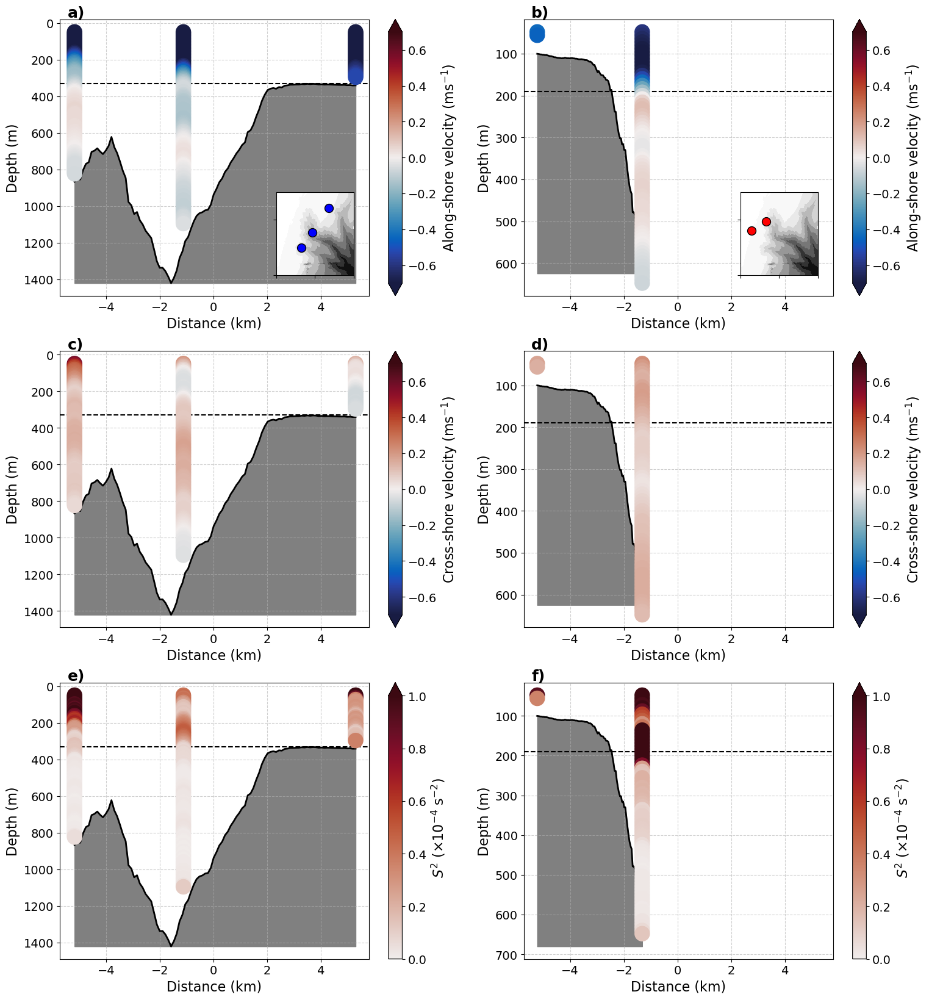

In [49]:
gs = gridspec.GridSpec(nrows=3, ncols=2, wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[18,20])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

xmin=np.nanmin([np.nanmin(ds.cross_canyon.values) for ds in sol1_t1] + [np.nanmin(ds.cross_canyon.values) for ds in sol2_t1])-0.5
xmax=np.nanmax([np.nanmax(ds.cross_canyon.values) for ds in sol1_t1] + [np.nanmax(ds.cross_canyon.values) for ds in sol2_t1])+0.5


ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 u
plot_transect_vel(ax,sol1_t1, 'along', 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(330,c='k',linestyle='--')

axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-2800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1_t1):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='b', edgecolor='black', s=100)
axin.set_xlim([153.5,153.7])
axin.set_ylim([-30.1,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 v
plot_transect_vel(ax,sol1_t1,  'cross', 'cross_canyon')

plt.xlim(xmin,xmax)
plt.axhline(330,c='k',linestyle='--')



ax = fig.add_subplot(gs[2,0])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol1_t1, 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(330,c='k',linestyle='--')


ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 2 u
plot_transect_vel(ax,sol2_t1,  'along', 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(190,c='k',linestyle='--')

axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-2800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol2_t1):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='r', edgecolor='black', s=100)
axin.set_xlim([153.5,153.7])
axin.set_ylim([-30.1,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 2 v
plot_transect_vel(ax,sol2_t1,  'cross', 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(190,c='k',linestyle='--')
ax = fig.add_subplot(gs[2,1])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol2_t1, 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(190,c='k',linestyle='--')

# Figure 4

In [35]:
S1_head=sol1_adcp.isel(time=np.r_[1900:1940])

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3212956699.py:44: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3212956699.py:45: UserWarning: The following kwargs were not used by contour: 'linstyle', 'linewdith'
  CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linstyle='-',colors='k',linewdith=2)
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3212956699.py:59: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explici

<Figure size 640x480 with 0 Axes>

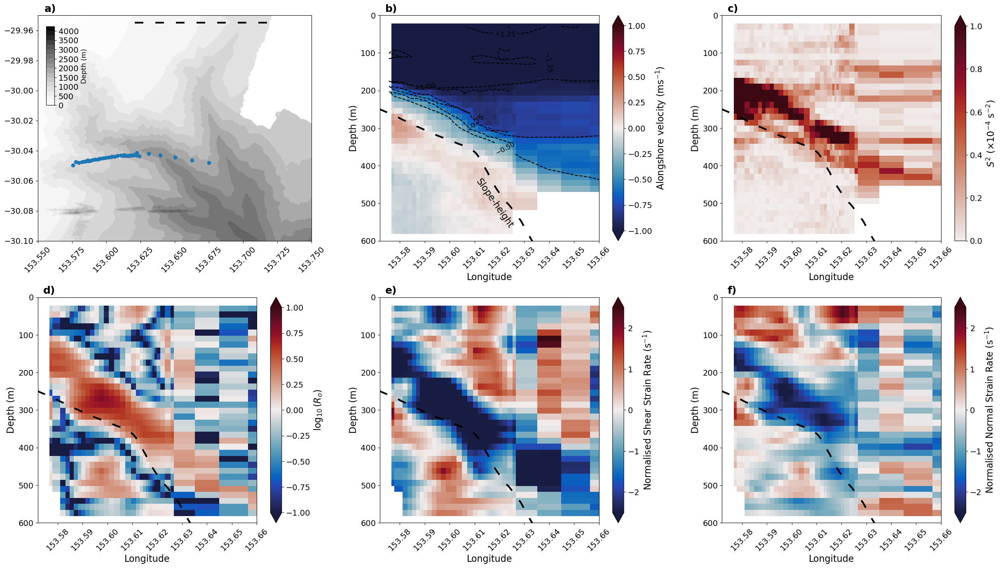

In [188]:
gs = gridspec.GridSpec(nrows=2, ncols=3, wspace=0.25, hspace=0.25)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[30, 16])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

# Prepare slope data
slope_lon = bathy.sel(lat=-29.955, method='nearest').lon - 0.045
slope_h = -1*bathy.sel(lat=-29.955, method='nearest').Band1

# Prepare grid for pcolormesh
lons_grid = S1_head.lon.values
depths_grid = np.array([np.nanmean(sol1_adcp.isel(depth_cell=depth_idx).depth) 
                         for depth_idx in range(35)])

ax = fig.add_subplot(gs[0,0])

ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
conf=plt.contourf(lon_bathy, lat_bathy, -1*bathy.Band1.values, levels=np.arange(0,4500, 250), cmap='Greys')
plt.scatter(S1_head.lon, S1_head.lat)
plt.plot([min(S1_head.lon)+0.045,max(S1_head.lon)+0.045],[-29.955,-29.955],c='k',linewidth=3,linestyle=(0, (5, 7)))
plt.xlim([153.55, 153.75])
plt.ylim([-30.1, -29.95])
ax.tick_params(axis='x', rotation=45)

cax = inset_axes(ax,
            width="3%",  # width = 10% of parent_bbox width
            height="50%",  # height : 50%
            loc='lower left',
            bbox_to_anchor=(.03,.6, 1, .7),
            bbox_transform=ax.transAxes,
            borderpad=0.03,
            )
cbar = fig.colorbar(conf, cax=cax, orientation="vertical")
cbar.set_label('Depth (m)',fontsize=12)

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')

ax.text(153.618, 500, 'Slope-height', rotation=-55, ha='center', va='center')
_,vel_data=proj_vels(S1_head.isel(depth_cell=slice(0,35)),70)
pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linstyle='-',colors='k',linewdith=2)
ax.clabel(CS, CS.levels,  fontsize=12)

plt.colorbar(pc, label='Alongshore velocity (ms$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[0,2])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
calc_shear_slice_data = np.array([calc_shear_slice(S1_head).isel(depth_cell=depth_idx).values for depth_idx in range(35)])
pc = plt.pcolormesh(lons_grid, depths_grid, calc_shear_slice_data*1e4, vmin=0, vmax=1, cmap='cmo.amp', shading='nearest')
plt.colorbar(pc, label=r'$S^2$ ($\times 10^{-4}$ s$^{-2}$)', extend='max')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
vorticity_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol1_adcp, S1_head.lon.values, S1_head.lat.values, depth_idx)
    vorticity_data.append(np.log10(np.abs(result['rossby_at_points'])))
vorticity_data = np.array(vorticity_data)
pc = plt.pcolormesh(lons_grid, depths_grid, vorticity_data, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.colorbar(pc, label=r'$\log_{10}(R_o)$', extend='both')
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
shear_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol1_adcp, S1_head.lon.values, S1_head.lat.values, depth_idx)
    shear_strain_data.append(result['shear_at_points'])
shear_strain_data = np.array(shear_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, shear_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Shear Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,2])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
normal_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol1_adcp, S1_head.lon.values, S1_head.lat.values, depth_idx)
    normal_strain_data.append(result['strain_at_points'])
normal_strain_data = np.array(normal_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, normal_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Normal Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\2466618163.py:44: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\2466618163.py:59: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  pc = plt.pcolormesh(lons_grid, depths_grid, calc_shear_slice_data*1e4, vmin=0, vmax=1, cmap='cmo.amp', shading='nearest')
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\2466618163.py:77: UserWarning: The input coordinates to pcolormesh 

<Figure size 640x480 with 0 Axes>

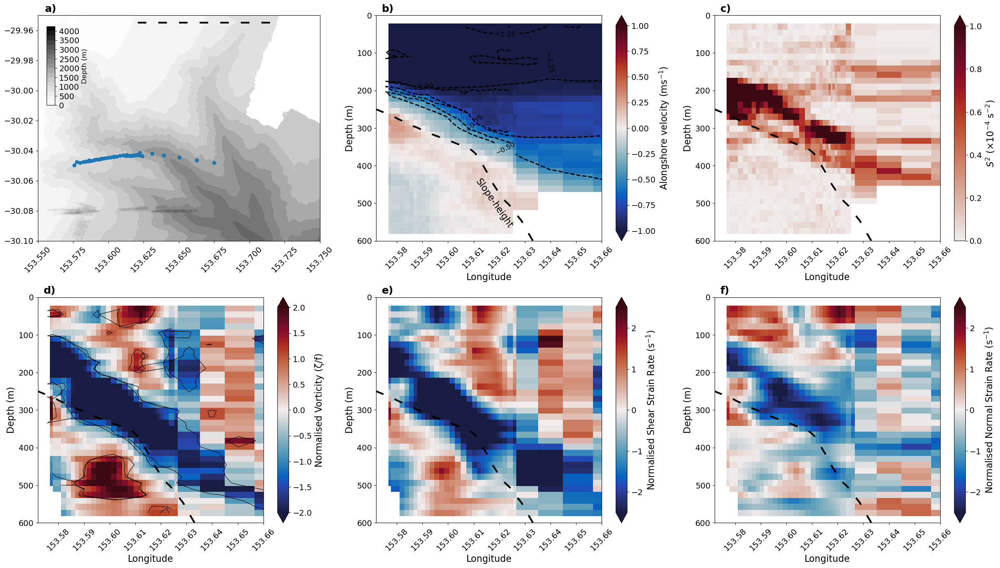

In [49]:
gs = gridspec.GridSpec(nrows=2, ncols=3, wspace=0.2, hspace=0.25)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[30, 16])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

# Prepare slope data
slope_lon = bathy.sel(lat=-29.955, method='nearest').lon - 0.045
slope_h = -1*bathy.sel(lat=-29.955, method='nearest').Band1

# Prepare grid for pcolormesh
lons_grid = S1_head.lon.values
depths_grid = np.array([np.nanmean(sol1_adcp.isel(depth_cell=depth_idx).depth) 
                         for depth_idx in range(35)])

ax = fig.add_subplot(gs[0,0])

ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
conf=plt.contourf(lon_bathy, lat_bathy, -1*bathy.Band1.values, levels=np.arange(0,4500, 250), cmap='Greys')
plt.scatter(S1_head.lon, S1_head.lat)
plt.plot([min(S1_head.lon)+0.045,max(S1_head.lon)+0.045],[-29.955,-29.955],c='k',linewidth=3,linestyle=(0, (5, 7)))
plt.xlim([153.55, 153.75])
plt.ylim([-30.1, -29.95])
ax.tick_params(axis='x', rotation=45)

cax = inset_axes(ax,
            width="3%",  # width = 10% of parent_bbox width
            height="50%",  # height : 50%
            loc='lower left',
            bbox_to_anchor=(.03,.6, 1, .7),
            bbox_transform=ax.transAxes,
            borderpad=0.03,
            )
cbar = fig.colorbar(conf, cax=cax, orientation="vertical")
cbar.set_label('Depth (m)',fontsize=12)

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')

ax.text(153.618, 500, 'Slope-height', rotation=-55, ha='center', va='center')
_,vel_data=proj_vels(S1_head.isel(depth_cell=slice(0,35)),70)
pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linestyles='--',colors='k',linewidths=2)
ax.clabel(CS, CS.levels,  fontsize=12)

plt.colorbar(pc, label='Alongshore velocity (ms$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[0,2])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
calc_shear_slice_data = np.array([calc_shear_slice(S1_head).isel(depth_cell=depth_idx).values for depth_idx in range(35)])
pc = plt.pcolormesh(lons_grid, depths_grid, calc_shear_slice_data*1e4, vmin=0, vmax=1, cmap='cmo.amp', shading='nearest')
plt.colorbar(pc, label=r'$S^2$ ($\times 10^{-4}$ s$^{-2}$)', extend='max')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')

vorticity_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol1_adcp, S1_head.lon.values, S1_head.lat.values, depth_idx)
    vorticity_data.append(result['rossby_at_points'])  # removed log10/abs
vorticity_data = np.array(vorticity_data)

pc = ax.pcolormesh(lons_grid, depths_grid, vorticity_data,vmin=-2, vmax=2, cmap='cmo.balance', shading='nearest')
# Contour line at |Ro| = 1 threshold
ax.contour(lons_grid, depths_grid, np.abs(vorticity_data), levels=[1],colors='k',linewidths=0.8)

plt.colorbar(pc, label='Normalised Vorticity (ζ/f)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3, linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
shear_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol1_adcp, S1_head.lon.values, S1_head.lat.values, depth_idx)
    shear_strain_data.append(result['shear_at_points'])
shear_strain_data = np.array(shear_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, shear_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Shear Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,2])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
normal_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol1_adcp, S1_head.lon.values, S1_head.lat.values, depth_idx)
    normal_strain_data.append(result['strain_at_points'])
normal_strain_data = np.array(normal_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, normal_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Normal Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.66)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

# Figure 5

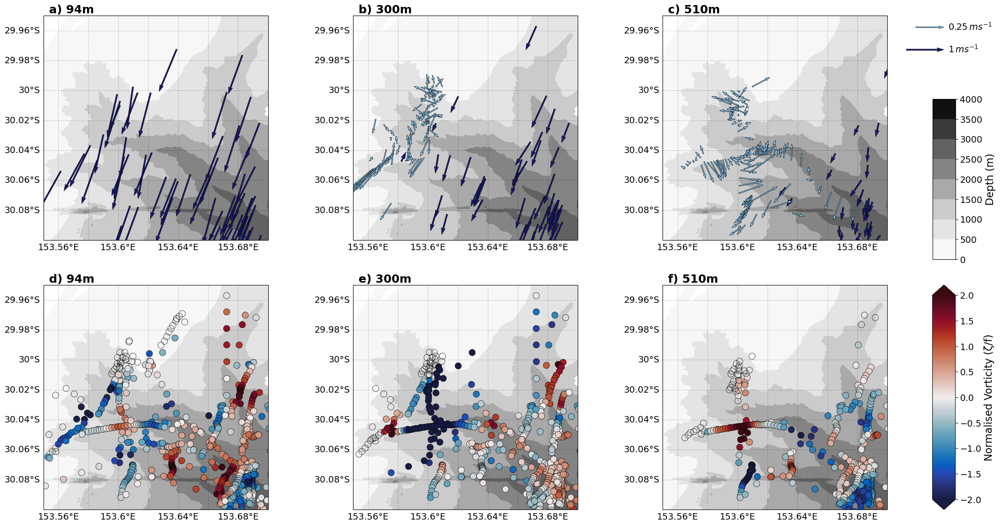

In [50]:
# ==================== FIGURE 1: sol1_adcp ====================
gs1 = gridspec.GridSpec(nrows=2, ncols=3, wspace=0.15, hspace=0.2)
fig1 = plt.figure(figsize=[25, 14])
plt.rcParams.update({'font.size': 14, 'xtick.labelsize': 14, 'ytick.labelsize': 14})

# Configuration for Figure 1
plot_configs_fig1 = [
    # Row 0: Quivers only
    ('a) 94m', sol1_adcp, 4, 0, 0, 'quiver'),
    ('b) 300m', sol1_adcp, 17, 0, 1, 'quiver'),
    ('c) 510m', sol1_adcp, 30, 0, 2, 'quiver'),
    # Row 1: Normalized vorticity only
    ('d) 94m', sol1_adcp, 4, 1, 0, 'vorticity'),
    ('e) 300m', sol1_adcp, 17, 1, 1, 'vorticity'),
    ('f) 510m', sol1_adcp, 30, 1, 2, 'vorticity'),
]

# Create all subplots for Figure 1
scatter1 = None

for title, adcp_data, depth_idx, row, col, plot_type in plot_configs_fig1:
    ax = fig1.add_subplot(gs1[row, col], projection=ccrs.PlateCarree())
    scatter, seafloor,Qsmall, Qlarge = create_subplot_split(ax, title, adcp_data, depth_idx, plot_type)
    
    if scatter is not None:
        scatter1 = scatter

    if seafloor is not None:
        seafloor1 = seafloor

    if row ==0 and col==2:
        ax.quiverkey(Qsmall, 1.25, 0.95, 0.25, r'$0.25 \, ms^{-1}$', labelpos='E', 
                   coordinates='axes', fontproperties={'weight': 'bold', 'size': 14})
        ax.quiverkey(Qlarge, 1.25, 0.85, 1, r'$1 \, ms^{-1}$', labelpos='E', 
                   coordinates='axes', fontproperties={'weight': 'bold', 'size': 14})
  
# Add colorbar for vorticity (second row)
cbar_ax1 = fig1.add_axes([0.92, 0.5, 0.02, 0.25])
cbar1 = fig1.colorbar(seafloor1, extend='both',cax=cbar_ax1)
cbar1.set_label('Depth (m)', fontsize=16)

# Add colorbar for vorticity (second row)
cbar_ax2 = fig1.add_axes([0.92, 0.11, 0.02, 0.35])
cbar2 = fig1.colorbar(scatter1, extend='both',cax=cbar_ax2)
cbar2.set_label('Normalised Vorticity (ζ/f)', fontsize=16)



plt.show()

# Figure 6

In [51]:
S2_head=sol2_adcp.isel(time=np.r_[530:550])

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\1186013809.py:41: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\1186013809.py:42: UserWarning: The following kwargs were not used by contour: 'linstyle', 'linewdith'
  CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linstyle='-',colors='k',linewdith=2)
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\1186013809.py:56: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explici

<Figure size 640x480 with 0 Axes>

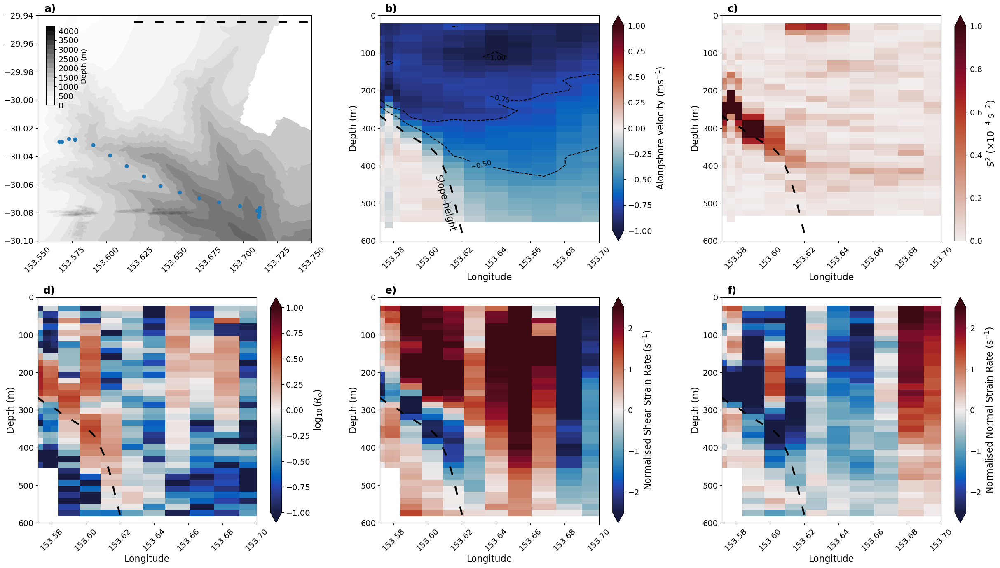

In [135]:
gs = gridspec.GridSpec(nrows=2, ncols=3, wspace=0.25, hspace=0.25)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[30, 16])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

slope_lon=bathy.sel(lat=-29.945,method='nearest').lon-0.055
slope_h=-1*bathy.sel(lat=-29.945,method='nearest').Band1

# Prepare grid for pcolormesh
lons_grid = S2_head.lon.values
depths_grid = np.array([np.nanmean(sol2_adcp.isel(depth_cell=depth_idx).depth) 
                         for depth_idx in range(35)])

ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
conf=plt.contourf(lon_bathy, lat_bathy, -1*bathy.Band1.values,levels=np.arange(0,4500, 250), cmap='Greys')
plt.scatter(S2_head.lon,S2_head.lat)
plt.plot([min(S2_head.lon)+0.055,max(S2_head.lon)+0.055],[-29.945,-29.945],c='k',linewidth=3,linestyle=(0, (5, 7)))
plt.xlim([153.55, 153.75])
plt.ylim([-30.1, -29.94])
ax.tick_params(axis='x', rotation=45)

cax = inset_axes(ax,
            width="3%",  # width = 10% of parent_bbox width
            height="50%",  # height : 50%
            loc='lower left',
            bbox_to_anchor=(.03,.6, 1, .7),
            bbox_transform=ax.transAxes,
            borderpad=0.03,
            )
cbar = fig.colorbar(conf, cax=cax, orientation="vertical")
cbar.set_label('Depth (m)',fontsize=12)

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.text(153.61, 500, 'Slope-height', rotation=-75, ha='center', va='center')
_,vel_data=proj_vels(S2_head.isel(depth_cell=slice(0,35)),70)
pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linstyle='-',colors='k',linewdith=2)
ax.clabel(CS, CS.levels,  fontsize=12)

plt.colorbar(pc, label='Alongshore velocity (ms$^{-1}$)',extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[0,2])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
calc_shear_slice_data = np.array([calc_shear_slice(S2_head).isel(depth_cell=depth_idx).values for depth_idx in range(35)])
pc = plt.pcolormesh(lons_grid, depths_grid, calc_shear_slice_data*1e4, vmin=0, vmax=1, cmap='cmo.amp', shading='nearest')
plt.colorbar(pc, label=r'$S^2$ ($\times 10^{-4}$ s$^{-2}$)', extend='max')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
vorticity_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol2_adcp, S2_head.lon.values, S2_head.lat.values, depth_idx)
    vorticity_data.append(np.log10(np.abs(result['rossby_at_points'])))
vorticity_data = np.array(vorticity_data)
pc = plt.pcolormesh(lons_grid, depths_grid, vorticity_data, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.colorbar(pc, label=r'$\log_{10}(R_o)$', extend='both')
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
shear_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol2_adcp, S2_head.lon.values, S2_head.lat.values, depth_idx)
    shear_strain_data.append(result['shear_at_points'])
shear_strain_data = np.array(shear_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, shear_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Shear Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,2])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
normal_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol2_adcp, S2_head.lon.values, S2_head.lat.values, depth_idx)
    normal_strain_data.append(result['strain_at_points'])
normal_strain_data = np.array(normal_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, normal_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Normal Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\1395501283.py:41: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\1395501283.py:42: UserWarning: The following kwargs were not used by contour: 'linewiths'
  CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linestyles='--',colors='k',linewiths=2)
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\1395501283.py:56: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell ed

<Figure size 640x480 with 0 Axes>

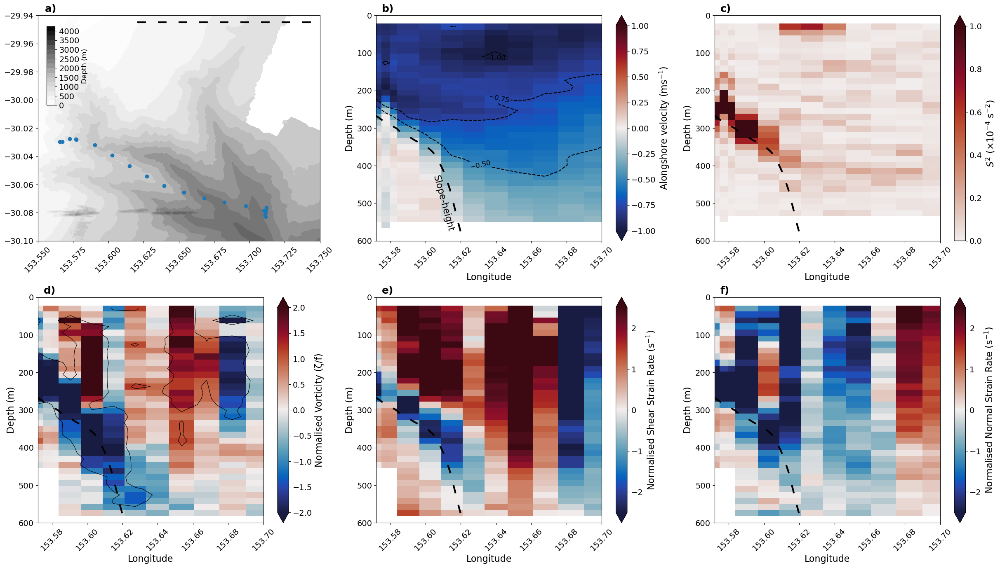

In [56]:
gs = gridspec.GridSpec(nrows=2, ncols=3, wspace=0.2, hspace=0.25)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[30, 16])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

slope_lon=bathy.sel(lat=-29.945,method='nearest').lon-0.055
slope_h=-1*bathy.sel(lat=-29.945,method='nearest').Band1

# Prepare grid for pcolormesh
lons_grid = S2_head.lon.values
depths_grid = np.array([np.nanmean(sol2_adcp.isel(depth_cell=depth_idx).depth) 
                         for depth_idx in range(35)])

ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
conf=plt.contourf(lon_bathy, lat_bathy, -1*bathy.Band1.values,levels=np.arange(0,4500, 250), cmap='Greys')
plt.scatter(S2_head.lon,S2_head.lat)
plt.plot([min(S2_head.lon)+0.055,max(S2_head.lon)+0.055],[-29.945,-29.945],c='k',linewidth=3,linestyle=(0, (5, 7)))
plt.xlim([153.55, 153.75])
plt.ylim([-30.1, -29.94])
ax.tick_params(axis='x', rotation=45)

cax = inset_axes(ax,
            width="3%",  # width = 10% of parent_bbox width
            height="50%",  # height : 50%
            loc='lower left',
            bbox_to_anchor=(.03,.6, 1, .7),
            bbox_transform=ax.transAxes,
            borderpad=0.03,
            )
cbar = fig.colorbar(conf, cax=cax, orientation="vertical")
cbar.set_label('Depth (m)',fontsize=12)

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.text(153.61, 500, 'Slope-height', rotation=-75, ha='center', va='center')
_,vel_data=proj_vels(S2_head.isel(depth_cell=slice(0,35)),70)
pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-1.25,-1,-0.75,-0.5],linestyles='--',colors='k',linewiths=2)
ax.clabel(CS, CS.levels,  fontsize=12)

plt.colorbar(pc, label='Alongshore velocity (ms$^{-1}$)',extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[0,2])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
calc_shear_slice_data = np.array([calc_shear_slice(S2_head).isel(depth_cell=depth_idx).values for depth_idx in range(35)])
pc = plt.pcolormesh(lons_grid, depths_grid, calc_shear_slice_data*1e4, vmin=0, vmax=1, cmap='cmo.amp', shading='nearest')
plt.colorbar(pc, label=r'$S^2$ ($\times 10^{-4}$ s$^{-2}$)', extend='max')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
vorticity_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol2_adcp, S2_head.lon.values, S2_head.lat.values, depth_idx)
    vorticity_data.append(result['rossby_at_points'])
vorticity_data = np.array(vorticity_data)

pc = plt.pcolormesh(lons_grid, depths_grid, vorticity_data, vmin=-2, vmax=2, cmap='cmo.balance', shading='nearest')
ax.contour(lons_grid, depths_grid, np.abs(vorticity_data), levels=[1],colors='k',linewidths=0.8)

plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.colorbar(pc, label='Normalised Vorticity (ζ/f)', extend='both')
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)



ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
shear_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol2_adcp, S2_head.lon.values, S2_head.lat.values, depth_idx)
    shear_strain_data.append(result['shear_at_points'])
shear_strain_data = np.array(shear_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, shear_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Shear Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[1,2])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
normal_strain_data = []
for depth_idx in range(35):
    result = calculate_vorticity_slice(sol2_adcp, S2_head.lon.values, S2_head.lat.values, depth_idx)
    normal_strain_data.append(result['strain_at_points'])
normal_strain_data = np.array(normal_strain_data)
pc = plt.pcolormesh(lons_grid, depths_grid, normal_strain_data, vmin=-2.5, vmax=2.5, cmap='cmo.balance', shading='nearest')
plt.colorbar(pc, label=r'Normalised Normal Strain Rate (s$^{-1}$)', extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)

# Figure 7

In [53]:
sol2_adcp_sub=sol2_adcp.isel(time=np.r_[0:1159])

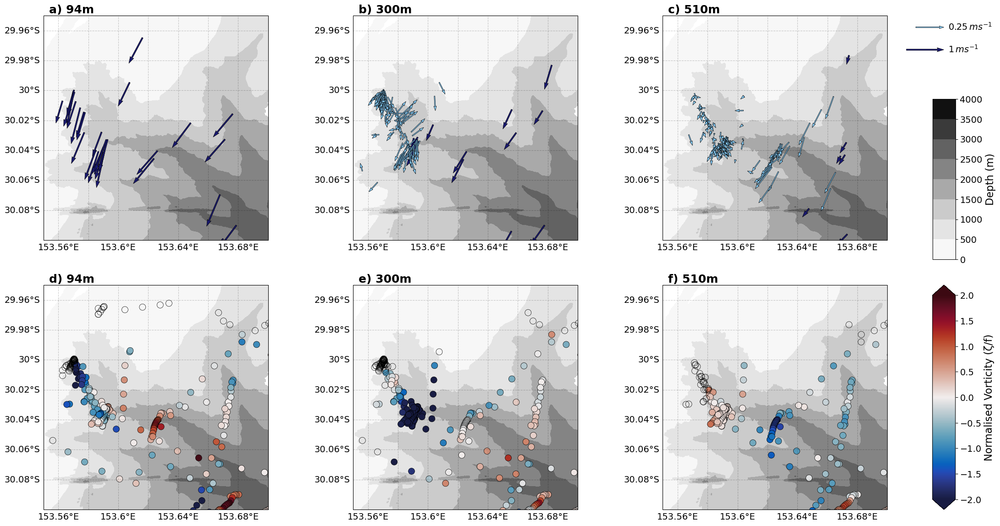

In [54]:
# ==================== FIGURE 2: sol2_adcp_sub ====================
gs2 = gridspec.GridSpec(nrows=2, ncols=3, wspace=0.15, hspace=0.2)
fig2 = plt.figure(figsize=[25, 14])
plt.rcParams.update({'font.size': 14, 'xtick.labelsize': 14, 'ytick.labelsize': 14})

# Configuration for Figure 2
plot_configs_fig2 = [
    # Row 0: Quivers only
    ('a) 94m', sol2_adcp_sub, 4, 0, 0, 'quiver'),
    ('b) 300m', sol2_adcp_sub, 17, 0, 1, 'quiver'),
    ('c) 510m', sol2_adcp_sub, 30, 0, 2, 'quiver'),
    # Row 1: Normalized vorticity only
    ('d) 94m', sol2_adcp_sub, 4, 1, 0, 'vorticity'),
    ('e) 300m', sol2_adcp_sub, 17, 1, 1, 'vorticity'),
    ('f) 510m', sol2_adcp_sub, 30, 1, 2, 'vorticity'),
]


# Create all subplots for Figure 1
scatter1 = None

for title, adcp_data, depth_idx, row, col, plot_type in plot_configs_fig2:
    ax = fig2.add_subplot(gs2[row, col], projection=ccrs.PlateCarree())
    scatter, seafloor, Qsmall, Qlarge = create_subplot_split(ax, title, adcp_data, depth_idx, plot_type)
    
    if scatter is not None:
        scatter1 = scatter

    if seafloor is not None:
        seafloor1 = seafloor

    if row ==0 and col==2:
        ax.quiverkey(Qsmall, 1.25, 0.95, 0.25, r'$0.25 \, ms^{-1}$', labelpos='E', 
                   coordinates='axes', fontproperties={'weight': 'bold', 'size': 14})
        ax.quiverkey(Qlarge, 1.25, 0.85, 1, r'$1 \, ms^{-1}$', labelpos='E', 
                   coordinates='axes', fontproperties={'weight': 'bold', 'size': 14})
  
# Add colorbar for vorticity (second row)
cbar_ax1 = fig2.add_axes([0.92, 0.5, 0.02, 0.25])
cbar1 = fig2.colorbar(seafloor1, extend='both',cax=cbar_ax1)
cbar1.set_label('Depth (m)', fontsize=16)

# Add colorbar for vorticity (second row)
cbar_ax2 = fig2.add_axes([0.92, 0.11, 0.02, 0.35])
cbar2 = fig2.colorbar(scatter1, extend='both',cax=cbar_ax2)
cbar2.set_label('Normalised Vorticity (ζ/f)', fontsize=16)


plt.show()

# Figure 8

In [65]:
#get yoyos from plotting points and picking out clumps
sol1=[mixing[75],mixing[77],mixing[79],mixing[81],mixing[83]]
sol2= [mixing[76],mixing[78],mixing[80],mixing[82],mixing[84]]
sol5= [mixing[95],mixing[96],mixing[97],mixing[98],mixing[99]]

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3847920694.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_mix = mix_df.groupby(pd.cut(mix_df['depth'], depth_bins)).mean().reset_index(drop=True)
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3847920694.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_shear = shear_df.groupby(pd.cut(shear_df['depth'], depth_bins)).mean().reset_index(drop=True)
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3847920694.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of panda

<Figure size 640x480 with 0 Axes>

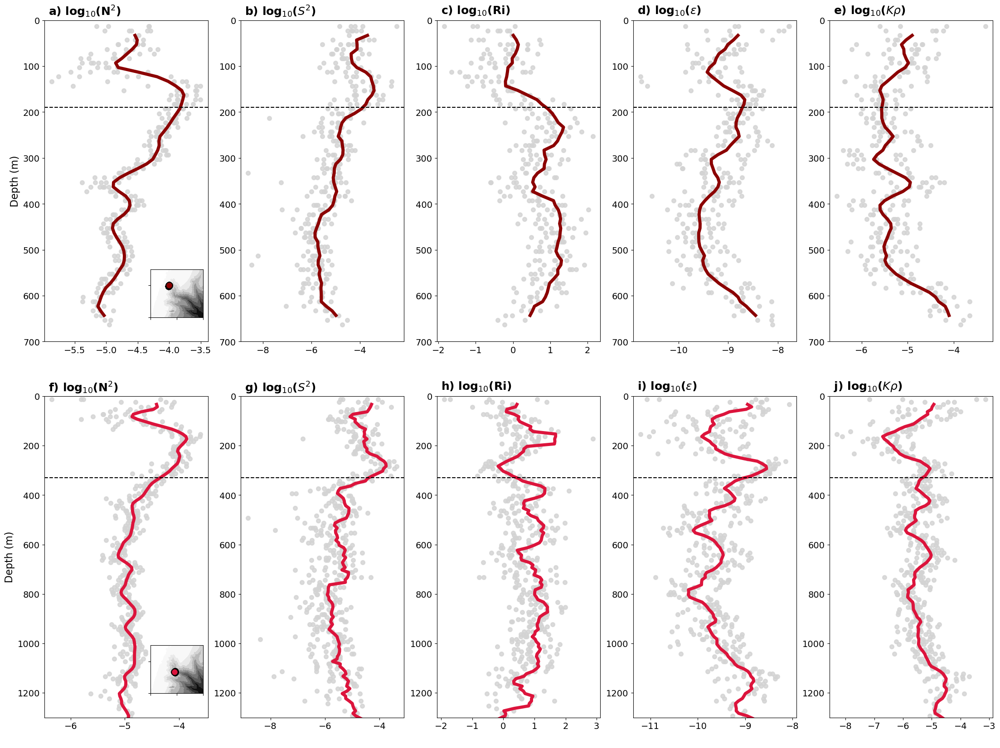

In [68]:
gs = gridspec.GridSpec(nrows=2, ncols=5, wspace=0.2, hspace=0.17)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[27, 20])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize'] = '14'
plt.rcParams['ytick.labelsize'] = '14'

# First row - original first figure data
mixing_ds = [mixing[75], mixing[77], mixing[79], mixing[81], mixing[83]]
vel_ds = [sol_ladcp[75], sol_ladcp[77], sol_ladcp[79], 
          sol_ladcp[81], sol_ladcp[83]]
Rich = calc_richardson(vel_ds, mixing_ds,'eps')

# Row 1, Column 1: N²
ax = fig.add_subplot(gs[0, 0])
ax.text(0.025, 1.05,'a) log$_{10}$(N$^2$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(np.log10(ds.N2))
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)

val= np.log10(pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().N2).rolling(window=5,center=True).mean())
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='darkred')
plt.axhline(190,c='k',linestyle='--')

plt.ylim(700, 0)
plt.xlabel(' ')
plt.ylabel('Depth (m)')

axin = ax.inset_axes([0.65, 0.075, 0.32, 0.15])
axin.contourf(lon_bathy, lat_bathy, bathy_data, levels=np.arange(-2800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(mixing_ds):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='darkred', edgecolor='black', s=100)
axin.set_xlim([153.5,153.7])
axin.set_ylim([-30.1,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

# Row 1, Column 2: Shear
ax = fig.add_subplot(gs[0, 1])
ax.text(0.025, 1.05,'b) log$_{10}$($S^2$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(np.log10(ds.shear))
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(700, 0)
plt.xlabel('')

val= np.log10(pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().shear).rolling(window=5,center=True).mean())
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='darkred')
plt.axhline(190,c='k',linestyle='--')

# Row 1, Column 3: Ri
ax = fig.add_subplot(gs[0, 2])
ax.text(0.025, 1.05,'c) log$_{10}$(Ri)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(np.log10(ds.Ri))
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(700, 0)
plt.xlabel(' ')

val= np.log10(pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().Ri).rolling(window=5,center=True).mean())
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='darkred')
plt.axhline(190,c='k',linestyle='--')

# Row 1, Column 4: epsilon
ax = fig.add_subplot(gs[0, 3])
ax.text(0.025, 1.05,'d) log$_{10}$($\\varepsilon$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(ds.eps)
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(700, 0)
plt.xlabel('')
plt.axhline(190,c='k',linestyle='--')

val= pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().eps).rolling(window=5,center=True).mean()
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='darkred')
plt.axhline(190,c='k',linestyle='--')

Rich = calc_richardson(vel_ds, mixing_ds,'Krho')
ax = fig.add_subplot(gs[0, 4])
ax.text(0.025, 1.05,'e) log$_{10}$($K\\rho$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(ds.Krho)
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(700, 0)
plt.xlabel('')

val= pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().Krho).rolling(window=5,center=True).mean()
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='darkred')
plt.axhline(190,c='k',linestyle='--')

# Second row - original second figure data
mixing_ds = [mixing[76], mixing[80], mixing[82], mixing[84]]
vel_ds = [sol_ladcp[76], sol_ladcp[80], sol_ladcp[82], sol_ladcp[84]]
Rich = calc_richardson(vel_ds, mixing_ds,'eps')

# Row 2, Column 1: N²
ax = fig.add_subplot(gs[1, 0])
ax.text(0.025, 1.05,'f) log$_{10}$(N$^2$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(np.log10(ds.N2))
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(1300, 0)
plt.xlabel('')
plt.ylabel('Depth (m)')
val= np.log10(pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().N2).rolling(window=5,center=True).mean())
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='crimson')
plt.axhline(330,c='k',linestyle='--')

axin = ax.inset_axes([0.65, 0.075, 0.32, 0.15])
axin.contourf(lon_bathy, lat_bathy, bathy_data, levels=np.arange(-2800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(mixing_ds):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='crimson', edgecolor='black', s=100)
axin.set_xlim([153.5,153.7])
axin.set_ylim([-30.1,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

# Row 2, Column 2: Shear
ax = fig.add_subplot(gs[1, 1])
ax.text(0.025, 1.05,'g) log$_{10}$($S^2$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(np.log10(ds.shear))
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(1300, 0)
plt.xlabel('')
val= np.log10(pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().shear).rolling(window=5,center=True).mean())
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='crimson')
plt.axhline(330,c='k',linestyle='--')

# Row 2, Column 3: Ri
ax = fig.add_subplot(gs[1, 2])
ax.text(0.025, 1.05,'h) log$_{10}$(Ri)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(np.log10(ds.Ri))
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(1300, 0)
plt.xlabel('')
val= np.log10(pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().Ri).rolling(window=5,center=True).mean())
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='crimson')
plt.axhline(330,c='k',linestyle='--')

# Row 2, Column 4: epsilon
ax = fig.add_subplot(gs[1, 3])
ax.text(0.025, 1.05,'i) log$_{10}$($\\varepsilon$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(ds.eps)
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(1300, 0)
plt.xlabel(' ')
val= pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().eps).rolling(window=5,center=True).mean()
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='crimson')
plt.axhline(330,c='k',linestyle='--')

Rich = calc_richardson(vel_ds, mixing_ds,'Krho')
ax = fig.add_subplot(gs[1, 4])
ax.text(0.025, 1.05,'j) log$_{10}$($K\\rho$)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
for i, ds in enumerate(Rich):
    depth = ds.depth_bins
    val = pd.Series(ds.Krho)
    ax.scatter(val, depth, c='lightgrey',alpha=0.8, linewidth=2)
plt.ylim(1300, 0)
plt.xlabel('')
val= pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().Krho).rolling(window=5,center=True).mean()
depth=pd.Series(pd.concat(Rich).groupby('depth_bins', as_index=False).mean().depth_bins)
ax.plot(val,depth,linewidth=5,c='crimson')
plt.axhline(330,c='k',linestyle='--')

plt.tight_layout()

# Figure 9

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\3232233810.py:26: UserWarning: linewidths is ignored by contourf
  ax.contourf(lon_bathy_sub, lat_bathy_sub, bathy_data_sub, levels=np.arange(-4800,0,250),cmap='Greys_r', linewidths=0.7)


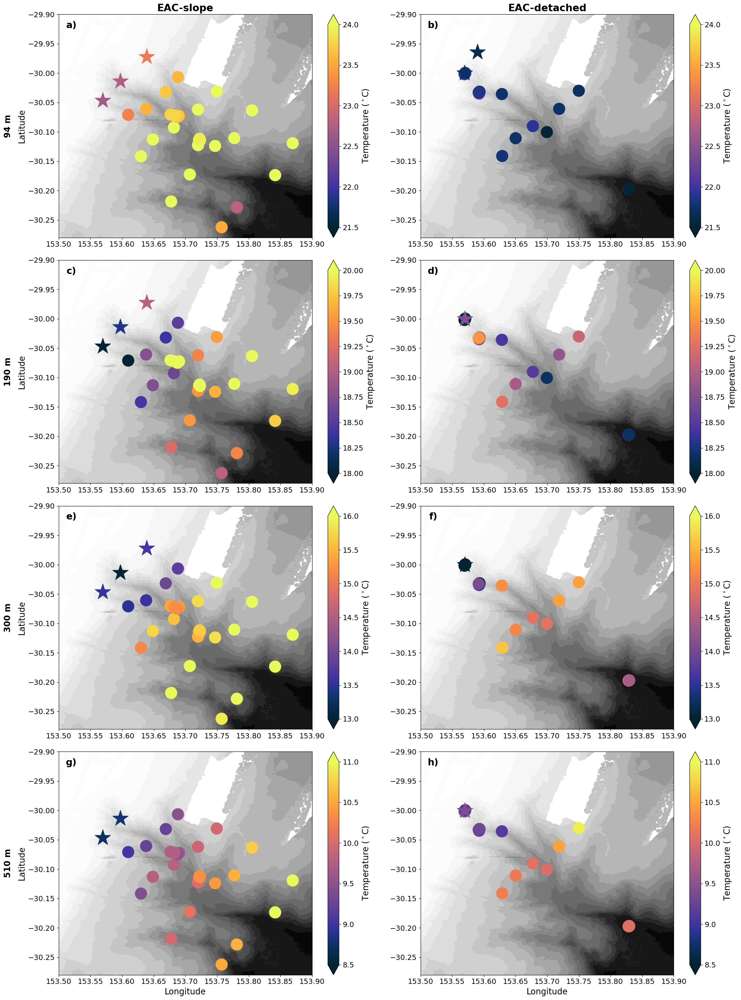

In [202]:
# Example for 5x2 subplot grid (5 depths, 2 datasets)
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'
plt.rcParams['font.size'] = '16' 
plt.rcParams['axes.labelsize'] = '16'  # For axis labels

fig, axes = plt.subplots(4, 2, figsize=(20, 27))

depths = [94, 190, 300, 510]
datasets = [sol1_ctd, sol2_ctd]
dataset_names = ['EAC-slope', 'EAC-detached']
variable='temperature'
cmap='cmo.thermal'
vbounds = [[21.5,24], [18,20], [13,16], [8.5,11]]
panel_labs=[['a)','c)','e)','g)'],['b)','d)','f)','h)']]
fig10=[[27,28,29],[85,83,87]]


for i, depth in enumerate(depths):
    for j, (dataset, name) in enumerate(zip(datasets, dataset_names)):
        ax = axes[i, j]
        
        # Plot on the specific axis - get the contour object from the function
        bathy_data_sub = bathy.sel(lon=slice(153.5,153.9),lat=slice(-30.28,-29.9)).Band1
        lon_bathy_sub, lat_bathy_sub = np.meshgrid(bathy.sel(lon=slice(153.5,153.9),lat=slice(-30.28,-29.9)).lon, bathy.sel(lon=slice(153.5,153.9),lat=slice(-30.28,-29.9)).lat)
        ax.contourf(lon_bathy_sub, lat_bathy_sub, bathy_data_sub, levels=np.arange(-4800,0,250),cmap='Greys_r', linewidths=0.7)


        points,cbar=plot_depth_scatter(dataset,depth,variable,vbounds[i],fig10[j],cmap,ax)
        ax.set_xlim([153.5,153.9])
        ax.set_ylim([-30.28,-29.9])
        # Set titles - only on top row
        if i == 0:
            ax.set_title(f'{name}',fontweight='bold')

        
        # Add depth labels on left column
        if j == 0:

            ax.text(-0.2, 0.5, f'{depth} m', fontweight='bold', transform=ax.transAxes, 
                rotation=90, va='center', ha='center', fontsize=16)

        ax.text(0.05,0.95,panel_labs[j][i], fontweight='bold', transform=ax.transAxes, va='center', ha='center', fontsize=18)
        
        # Only show x-labels on bottom row
        if i < len(depths) - 1:
            ax.set_xlabel('')
        else:
            ax.set_xlabel('Longitude')
        
        # Only show y-labels on left column
        if j > 0:
            ax.set_ylabel('')
        else:
            ax.set_ylabel('Latitude')

plt.tight_layout()

In [204]:
fig.savefig('C:\\Users\\uqmjef10\\OneDrive - The University of Queensland\\Documents\\PhD\\Chapter 1\\Paper_1_figures\\Manuscript_version\\Figure_09.png',dpi=300)

# Figure 10

In [97]:
sol1_t1_ctd =[sol_ctd[27],sol_ctd[29],sol_ctd[28]]
sol2_t1_ctd =[sol_ctd[85],sol_ctd[83],sol_ctd[87]]

<Figure size 640x480 with 0 Axes>

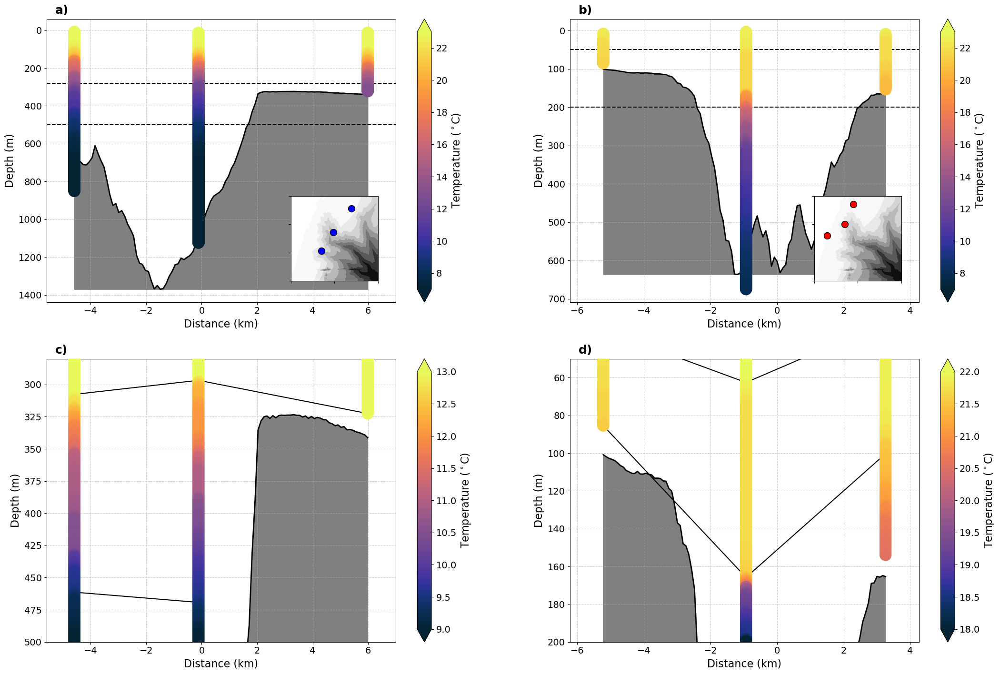

In [99]:
gs = gridspec.GridSpec(nrows=2, ncols=2, wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[26, 17])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

xmin=np.nanmin([np.nanmin(ds.cross_canyon.values) for ds in sol1_t1_ctd] + [np.nanmin(ds.cross_canyon.values) for ds in sol2_t1_ctd])-0.5
xmax=np.nanmax([np.nanmax(ds.cross_canyon.values) for ds in sol1_t1_ctd] + [np.nanmax(ds.cross_canyon.values) for ds in sol2_t1_ctd])+0.5

ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
fig, ax, sc = plot_transect(sol1_t1_ctd,'temperature', bathy,'cross_canyon',ax)
plt.axhline(280,c='k',linestyle='--')
plt.axhline(500,c='k',linestyle='--')

axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy_data, levels=np.arange(-2800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1_t1_ctd):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='b', edgecolor='black', s=100)
axin.set_xlim([153.5,153.7])
axin.set_ylim([-30.1,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
fig, ax, sc = plot_transect(sol2_t1_ctd,'temperature', bathy,'cross_canyon',ax)
plt.axhline(50,c='k',linestyle='--')
plt.axhline(200,c='k',linestyle='--')

axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy_data, levels=np.arange(-2800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol2_t1_ctd):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='r', edgecolor='black', s=100)
axin.set_xlim([153.5,153.7])
axin.set_ylim([-30.1,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])


ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
fig, ax, sc = plot_transect(sol1_t1_ctd,'temperature', bathy,'cross_canyon',ax,vmin=9,vmax=13)
plt.ylim(500,280)

depths_all = []  
dist_all = []  

for ds in sol1_t1_ctd:

    closest_index = np.nanargmin(abs((ds['temperature'].values - 13)))
    depth=ds.isel(depth=closest_index).depth.item()
    dist = ds.cross_canyon.item()

    depths_all.append(depth)
    dist_all.append(dist)  

plt.plot(dist_all, depths_all,c='k')

depths_all = []  
dist_all = []  

for ds in sol1_t1_ctd:
    if np.nanmin(abs((ds['temperature'].values - 9.5))) < 1:
        closest_index = np.nanargmin(abs((ds['temperature'].values - 9.5)))
        depth=ds.isel(depth=closest_index).depth.item()
        dist = ds.cross_canyon.item()

        depths_all.append(depth)
        dist_all.append(dist)  

plt.plot(dist_all, depths_all,c='k')

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
fig, ax, sc = plot_transect(sol2_t1_ctd,'temperature', bathy,'cross_canyon',ax,vmin=18,vmax=22)
plt.ylim(200,50)

depths_all = []  
dist_all = []  

for ds in sol2_t1_ctd:
    if np.nanmin(abs((ds['temperature'].values - 21.5))) < 0.5:
        closest_index = np.nanargmin(abs((ds['temperature'].values - 21.5)))
        depth=ds.isel(depth=closest_index).depth.item()
        dist = ds.cross_canyon.item()

        depths_all.append(depth)
        dist_all.append(dist)  

plt.plot(dist_all, depths_all,c='k')

depths_all = []  
dist_all = []  

for ds in sol2_t1_ctd:
    if np.nanmin(abs((ds['temperature'].values - 22))) < 1:
        closest_index = np.nanargmin(abs((ds['temperature'].values - 22)))
        depth=ds.isel(depth=closest_index).depth.item()
        dist = ds.cross_canyon.item()

        depths_all.append(depth)
        dist_all.append(dist)  

plt.plot(dist_all, depths_all,c='k')

# Supplementary Figures

In [2]:
Underway=pd.read_csv("C:/Users/uqmjef10/OneDrive - The University of Queensland/Documents/PhD/data/IN2024_V04_UWY_5min.csv")

math_direction = 90 - Underway['ultrasonicTrueWindDir(degree)']

# Convert to radians
direction_rad = np.radians(math_direction)

# Calculate u and v components
Underway['wind_u'] = 0.514444*Underway['ultrasonicTrueWindSpeed(knot)'] * np.cos(direction_rad)
Underway['wind_v']= 0.514444*Underway['ultrasonicTrueWindSpeed(knot)'] * np.sin(direction_rad)

Underway['datetime'] = pd.to_datetime(Underway['date'] + ' ' + Underway['time'], format='%d-%b-%y %H:%M:%S')
Underway_sol1 = Underway[(Underway['datetime'] >= '2024-06-09') & (Underway['datetime'] <= '2024-06-16')]
Underway_sol2 = Underway[(Underway['datetime'] >= '2024-06-24') & (Underway['datetime'] <= '2024-06-29')]

([], [])

<Figure size 640x480 with 0 Axes>

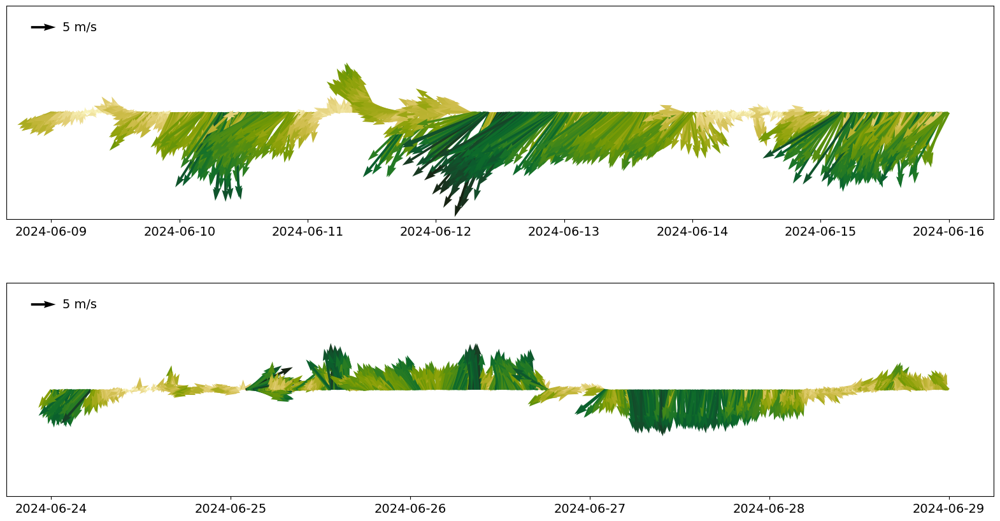

In [3]:
gs = gridspec.GridSpec(nrows=2,ncols=1,wspace=0.2, hspace=0.3)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[20,10])#what is this?
ax = None
plt.rcParams['font.size'] = '14'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'


ax = fig.add_subplot(gs[0,0])
q = ax.quiver(Underway_sol1['datetime'], 0, Underway_sol1['wind_u'], Underway_sol1['wind_v'], 0.514444*Underway_sol1['ultrasonicTrueWindSpeed(knot)'],scale=200,cmap="cmo.speed")
plt.quiverkey(q,X=0.05,Y=0.9,U=5,label='5 m/s',linewidth=2,labelpos='E')
plt.yticks([])

ax = fig.add_subplot(gs[1,0])
q = ax.quiver(Underway_sol2['datetime'], 0, Underway_sol2['wind_u'], Underway_sol2['wind_v'], 0.514444*Underway_sol2['ultrasonicTrueWindSpeed(knot)'],scale=200,cmap="cmo.speed")
plt.quiverkey(q,X=0.05,Y=0.9,U=5,label='5 m/s',linewidth=2,labelpos='E')
plt.yticks([])

In [50]:
sol1_t3 = [sol_ladcp[9], sol_ladcp[8], sol_ladcp[10],sol_ladcp[11], sol_ladcp[12]]

(-9.63469813927264, 8.392483326167856)

<Figure size 640x480 with 0 Axes>

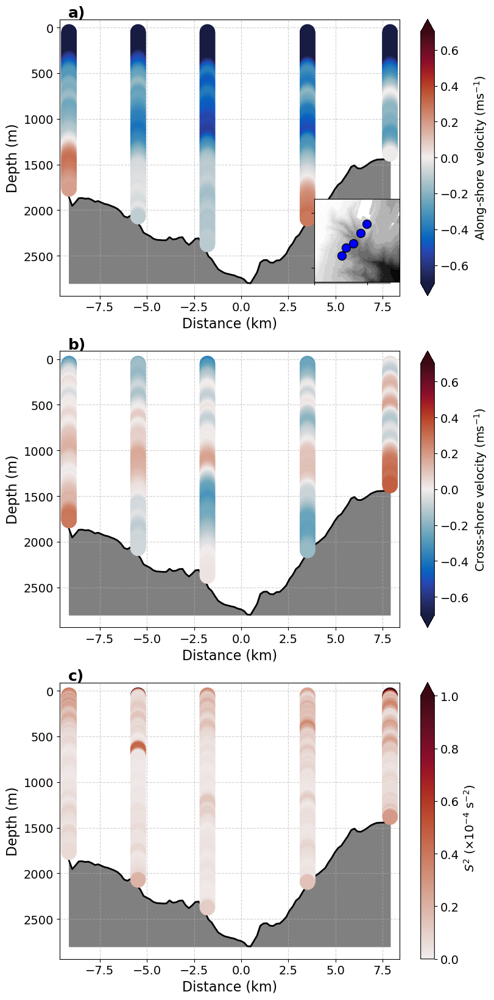

In [52]:
gs = gridspec.GridSpec(nrows=3, ncols=1, wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[9,20])
plt.rcParams['font.size'] = '14'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

xmin=np.nanmin([np.nanmin(ds.cross_canyon.values) for ds in sol1_t3] )-0.5
xmax=np.nanmax([np.nanmax(ds.cross_canyon.values) for ds in sol1_t3] )+0.5

ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 u
plot_transect_vel(ax,sol1_t3, 'along', 'cross_canyon')
plt.xlim(xmin,xmax)


axin = ax.inset_axes([0.75, 0.05, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-4800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1_t3):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='b', edgecolor='black', s=100)
axin.set_xlim([153.5,153.9])
axin.set_ylim([-30.25,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 v
plot_transect_vel(ax,sol1_t3,  'cross', 'cross_canyon')

plt.xlim(xmin,xmax)


ax = fig.add_subplot(gs[2,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol1_t3, 'cross_canyon')
plt.xlim(xmin,xmax)


<Figure size 640x480 with 0 Axes>

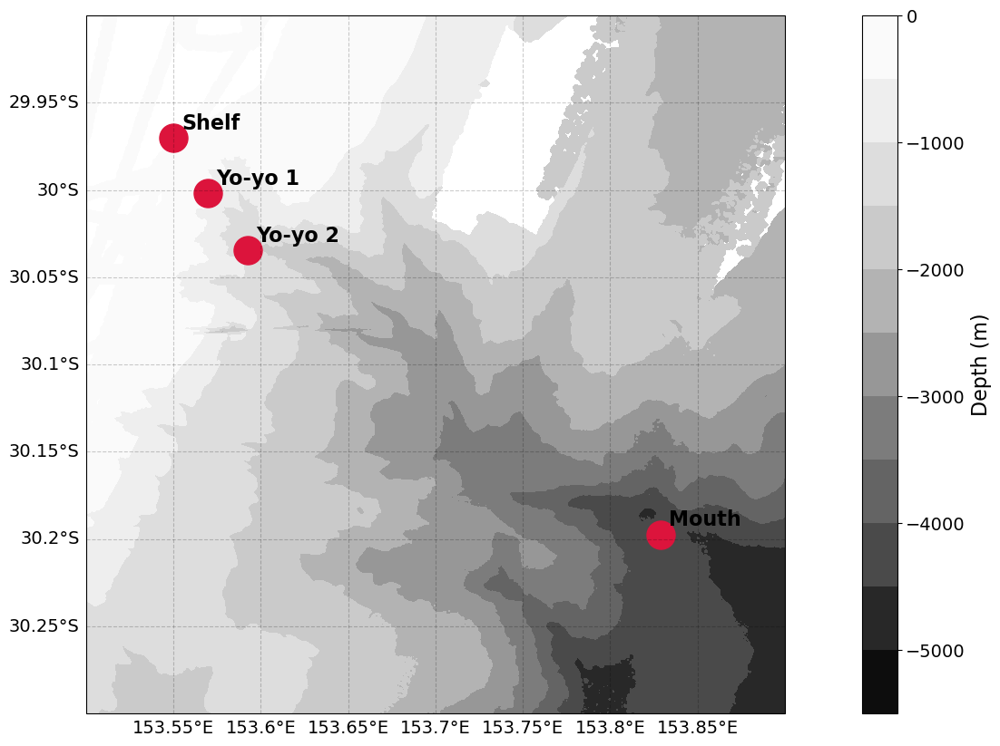

In [63]:


gs = gridspec.GridSpec(nrows=1,ncols=1,wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig= plt.figure(figsize=[22,10])
plt.rcParams['font.size'] = '14'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'
ax = None

ax=fig.add_subplot(gs[0,0],projection=ccrs.PlateCarree())

cs = ax.contourf(bathy['lon'].values, bathy['lat'].values, bathy['Band1'].values, 
                 levels=np.arange(-5500, 500, 500), cmap='Greys_r')

casts=[mixing[86], mixing[75],mixing[76],mixing[95]]

lons,lats=[],[]
for ds in casts:
    lons.append(ds.longitude.values[0])
    lats.append(ds.latitude.values[0])

plt.scatter(lons,lats,c='crimson',s=500)

labels = ['Shelf', 'Yo-yo 1', 'Yo-yo 2', 'Mouth']
for label, lon, lat in zip(labels, lons, lats):
    plt.annotate(label, (lon, lat),xytext=(7,7),textcoords='offset points', fontsize=16,fontweight='bold')
# Customize plot limits and labels
ax.set_xlim([153.5, 153.9])
ax.set_ylim([-30.3, -29.9])

gl = ax.gridlines(draw_labels=True,
                 color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True

cbar=fig.colorbar(cs, ax=ax,label=r'Depth (m)')
cbar.set_label(r'Depth (m)',fontsize=16)



solitary_nut1 fit: nox = 0.0003*temp⁴ + -0.0125*temp³ + 0.2591*temp² + -4.4659*temp + 48.4025
solitary_nut2 fit: nox = 0.0003*temp⁴ + -0.0108*temp³ + 0.1944*temp² + -3.9288*temp + 46.9432


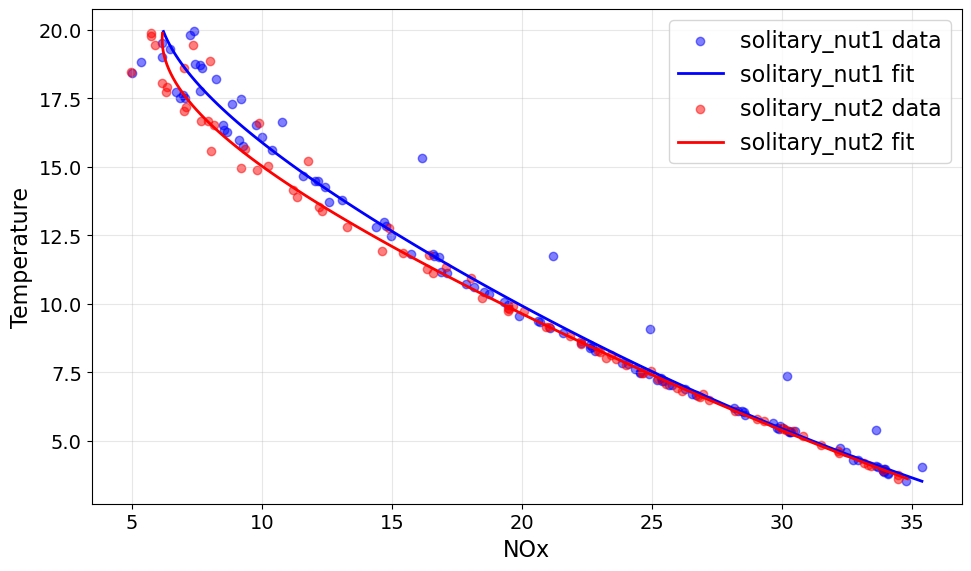

In [101]:
# Create figure
fig, ax = plt.subplots(figsize=(10, 6))

# ===== FIRST DATASET: solitary_nut1 =====
temp_min = 3.5
temp_max = 20

all_nox1 = []
all_temp1 = []

for i,ds in sol1_nut.items():
    if ds['cast'] == '008':
        continue
    
    nox_profile = ds['nox'].values[0, 0, :, 0]
    temp_profile = ds['temperature'].values[0, 0, :, 0]
    
    if len(nox_profile) > 0:
        mask = (temp_profile >= temp_min) & (temp_profile <= temp_max)
        all_nox1.extend(nox_profile[mask])
        all_temp1.extend(temp_profile[mask])

# Convert to arrays
all_nox1 = np.array(all_nox1)
all_temp1 = np.array(all_temp1)

valid_mask = np.isfinite(all_nox1) & np.isfinite(all_temp1)
all_nox1 = all_nox1[valid_mask]
all_temp1 = all_temp1[valid_mask]

# Fit quadratic
coeffs1 = np.polyfit(all_temp1, all_nox1, 4)
poly1 = np.poly1d(coeffs1)

temp_fit1 = np.linspace(all_temp1.min(), all_temp1.max(), 100)
nox_fit1 = poly1(temp_fit1)

# Plot
ax.scatter(all_nox1, all_temp1, c='blue', alpha=0.5, label='solitary_nut1 data')
ax.plot(nox_fit1, temp_fit1, 'b-', linewidth=2, label='solitary_nut1 fit')


print(f"solitary_nut1 fit: nox = {coeffs1[0]:.4f}*temp⁴ + {coeffs1[1]:.4f}*temp³ + {coeffs1[2]:.4f}*temp² + {coeffs1[3]:.4f}*temp + {coeffs1[4]:.4f}")

# ===== SECOND DATASET: solitary_nut2 =====
temp_min = 3.5
temp_max = 20

all_nox2 = []
all_temp2 = []

for i,ds in sol2_nut.items():
    nox_profile = ds['nox'].values[0, 0, :, 0]
    temp_profile = ds['temperature'].values[0, 0, :, 0]
    
    if len(nox_profile) > 0:
        mask = (temp_profile >= temp_min) & (temp_profile <= temp_max)
        all_nox2.extend(nox_profile[mask])
        all_temp2.extend(temp_profile[mask])

# Convert to arrays
all_nox2 = np.array(all_nox2)
all_temp2 = np.array(all_temp2)

valid_mask = np.isfinite(all_nox2) & np.isfinite(all_temp2)
all_nox2 = all_nox2[valid_mask]
all_temp2 = all_temp2[valid_mask]

# Fit quadratic
coeffs2 = np.polyfit(all_temp2, all_nox2, 4)
poly2 = np.poly1d(coeffs2)

temp_fit2 = np.linspace(all_temp2.min(), all_temp2.max(), 100)
nox_fit2 = poly2(temp_fit2)

# Plot
ax.scatter(all_nox2, all_temp2, c='red', alpha=0.5, label='solitary_nut2 data')
ax.plot(nox_fit2, temp_fit2, 'r-', linewidth=2, label='solitary_nut2 fit')


print(f"solitary_nut2 fit: nox = {coeffs2[0]:.4f}*temp⁴ + {coeffs2[1]:.4f}*temp³ + {coeffs2[2]:.4f}*temp² + {coeffs2[3]:.4f}*temp + {coeffs2[4]:.4f}")

# Finalize plot
ax.set_xlabel('NOx')
ax.set_ylabel('Temperature')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [102]:

# ===== STATISTICS FOR SOLITARY_NUT1 =====
# Predict nox values using the fitted model
nox_pred1 = poly1(all_temp1)

# Calculate statistics
r2_1 = r2_score(all_nox1, nox_pred1)
rmse_1 = np.sqrt(mean_squared_error(all_nox1, nox_pred1))
mae_1 = mean_absolute_error(all_nox1, nox_pred1)

# Calculate residuals
residuals_1 = all_nox1 - nox_pred1
residual_std_1 = np.std(residuals_1)

# Calculate percentage error
mape_1 = np.mean(np.abs((all_nox1 - nox_pred1) / all_nox1)) * 100

print("===== SOLITARY_NUT1 FIT STATISTICS =====")
print(f"R² score: {r2_1:.4f}")
print(f"RMSE: {rmse_1:.4f}")
print(f"MAE: {mae_1:.4f}")
print(f"Residual Std Dev: {residual_std_1:.4f}")
print(f"MAPE: {mape_1:.2f}%")
print(f"Number of points: {len(all_nox1)}")


# ===== STATISTICS FOR SOLITARY_NUT2 =====
nox_pred2 = poly2(all_temp2)

r2_2 = r2_score(all_nox2, nox_pred2)
rmse_2 = np.sqrt(mean_squared_error(all_nox2, nox_pred2))
mae_2 = mean_absolute_error(all_nox2, nox_pred2)

residuals_2 = all_nox2 - nox_pred2
residual_std_2 = np.std(residuals_2)

mape_2 = np.mean(np.abs((all_nox2 - nox_pred2) / all_nox2)) * 100

print("\n===== SOLITARY_NUT2 FIT STATISTICS =====")
print(f"R² score: {r2_2:.4f}")
print(f"RMSE: {rmse_2:.4f}")
print(f"MAE: {mae_2:.4f}")
print(f"Residual Std Dev: {residual_std_2:.4f}")
print(f"MAPE: {mape_2:.2f}%")
print(f"Number of points: {len(all_nox2)}")

===== SOLITARY_NUT1 FIT STATISTICS =====
R² score: 0.9861
RMSE: 1.1037
MAE: 0.6313
Residual Std Dev: 1.1037
MAPE: 4.70%
Number of points: 109

===== SOLITARY_NUT2 FIT STATISTICS =====
R² score: 0.9963
RMSE: 0.5551
MAE: 0.3628
Residual Std Dev: 0.5551
MAPE: 3.47%
Number of points: 80


In [57]:
S2_sadcp_thal=sol2_adcp.isel(time=np.r_[1159:1196])
S2_sadcp_thal=S2_sadcp_thal.where(S2_sadcp_thal.lon<153.7,drop=True)

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_25096\2820177598.py:42: UserWarning: The following kwargs were not used by contour: 'linstyle', 'linewdith'
  CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-0.3],linstyle='-',colors='k',linewdith=2)


<Figure size 640x480 with 0 Axes>

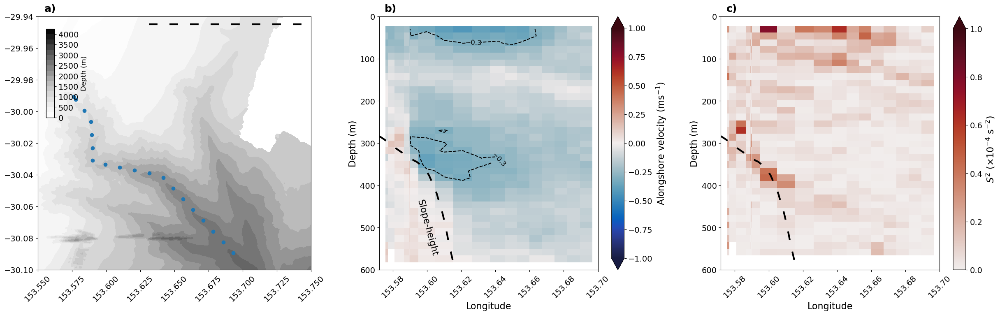

In [60]:
gs = gridspec.GridSpec(nrows=1, ncols=3, wspace=0.25, hspace=0.25)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[30, 8])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

slope_lon=bathy.sel(lat=-29.945,method='nearest').lon-0.06
slope_h=-1*bathy.sel(lat=-29.945,method='nearest').Band1

# Prepare grid for pcolormesh
lons_grid = S2_sadcp_thal.lon.values
depths_grid = np.array([np.nanmean(sol2_adcp.isel(depth_cell=depth_idx).depth) 
                         for depth_idx in range(35)])

ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
conf=plt.contourf(lon_bathy, lat_bathy, -1*bathy.Band1.values,levels=np.arange(0,4500, 250), cmap='Greys')
plt.scatter(S2_sadcp_thal.lon,S2_sadcp_thal.lat)
plt.plot([min(S2_sadcp_thal.lon)+0.055,max(S2_sadcp_thal.lon)+0.055],[-29.945,-29.945],c='k',linewidth=3,linestyle=(0, (5, 7)))
plt.xlim([153.55, 153.75])
plt.ylim([-30.1, -29.94])
ax.tick_params(axis='x', rotation=45)

cax = inset_axes(ax,
            width="3%",  # width = 10% of parent_bbox width
            height="50%",  # height : 50%
            loc='lower left',
            bbox_to_anchor=(.03,.6, 1, .7),
            bbox_transform=ax.transAxes,
            borderpad=0.03,
            )
cbar = fig.colorbar(conf, cax=cax, orientation="vertical")
cbar.set_label('Depth (m)',fontsize=12)

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
ax.text(153.6, 500, 'Slope-height', rotation=-75, ha='center', va='center')
_,vel_data=proj_vels(S2_sadcp_thal.isel(depth_cell=slice(0,35)),70)
pc = plt.pcolormesh(lons_grid, depths_grid, vel_data.T, vmin=-1, vmax=1, cmap='cmo.balance', shading='nearest')
CS=ax.contour(lons_grid, depths_grid, vel_data.T,levels=[-0.3],linstyle='-',colors='k',linewdith=2)
ax.clabel(CS, CS.levels,  fontsize=12)

plt.colorbar(pc, label='Alongshore velocity (ms$^{-1}$)',extend='both')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
ax.tick_params(axis='x', rotation=45)

ax = fig.add_subplot(gs[0,2])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
calc_shear_data = np.array([calc_shear_slice(S2_sadcp_thal).isel(depth_cell=depth_idx).values for depth_idx in range(35)])
pc = plt.pcolormesh(lons_grid, depths_grid, calc_shear_data*1e4, vmin=0, vmax=1, cmap='cmo.amp', shading='nearest')
plt.colorbar(pc, label=r'$S^2$ ($\times 10^{-4}$ s$^{-2}$)', extend='max')
plt.plot(slope_lon, slope_h, c='k', linewidth=3,linestyle=(0, (5, 7)))
plt.ylim(600, 0)
plt.xlim(153.572, 153.7)
plt.xlabel('Longitude')
plt.ylabel('Depth (m)')
ax.tick_params(axis='x', rotation=45)


(1.3194920113809638, 35.86455052010563)

<Figure size 640x480 with 0 Axes>

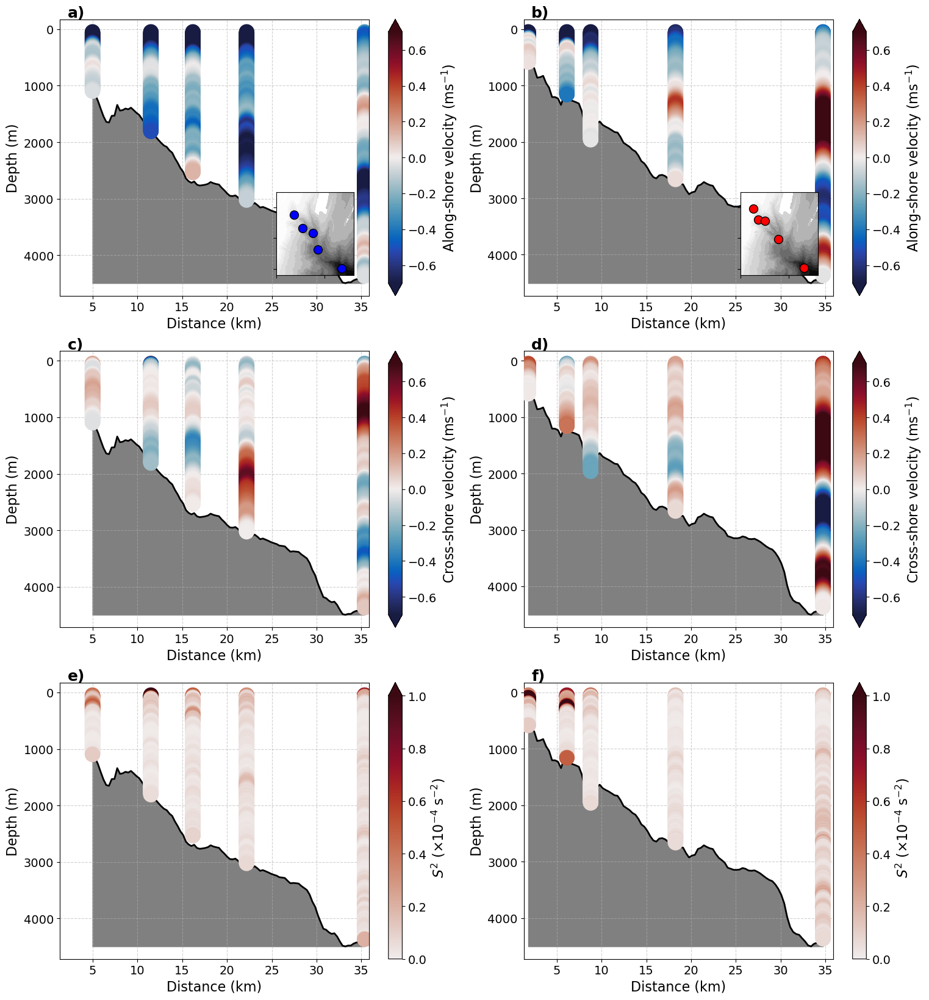

In [143]:
gs = gridspec.GridSpec(nrows=3, ncols=2, wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[18,20])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

xmin=np.nanmin([np.nanmin(ds.along_canyon.values) for ds in sol1_thal] + [np.nanmin(ds.along_canyon.values) for ds in sol2_thal])-0.5
xmax=np.nanmax([np.nanmax(ds.along_canyon.values) for ds in sol1_thal] + [np.nanmax(ds.along_canyon.values) for ds in sol2_thal])+0.5


ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 u
plot_transect_vel(ax,sol1_thal, 'along', 'along_canyon')
plt.xlim(xmin,xmax)


axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-4800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1_thal):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='b', edgecolor='black', s=100)
axin.set_xlim([153.5,153.9])
axin.set_ylim([-30.22,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 v
plot_transect_vel(ax,sol1_thal,  'cross', 'along_canyon')

plt.xlim(xmin,xmax)




ax = fig.add_subplot(gs[2,0])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol1_thal, 'along_canyon')
plt.xlim(xmin,xmax)



ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 2 u
plot_transect_vel(ax,sol2_thal,  'along', 'along_canyon')
plt.xlim(xmin,xmax)


axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-4800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol2_thal):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='r', edgecolor='black', s=100)
axin.set_xlim([153.5,153.9])
axin.set_ylim([-30.22,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 2 v
plot_transect_vel(ax,sol2_thal,  'cross', 'along_canyon')
plt.xlim(xmin,xmax)

ax = fig.add_subplot(gs[2,1])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol2_thal, 'along_canyon')
plt.xlim(xmin,xmax)


In [144]:
sol1_t2 = [sol_ladcp[31], sol_ladcp[30], sol_ladcp[32],sol_ladcp[33]]
sol1_t3 = [sol_ladcp[9], sol_ladcp[8], sol_ladcp[10],sol_ladcp[11], sol_ladcp[12]]

<Figure size 640x480 with 0 Axes>

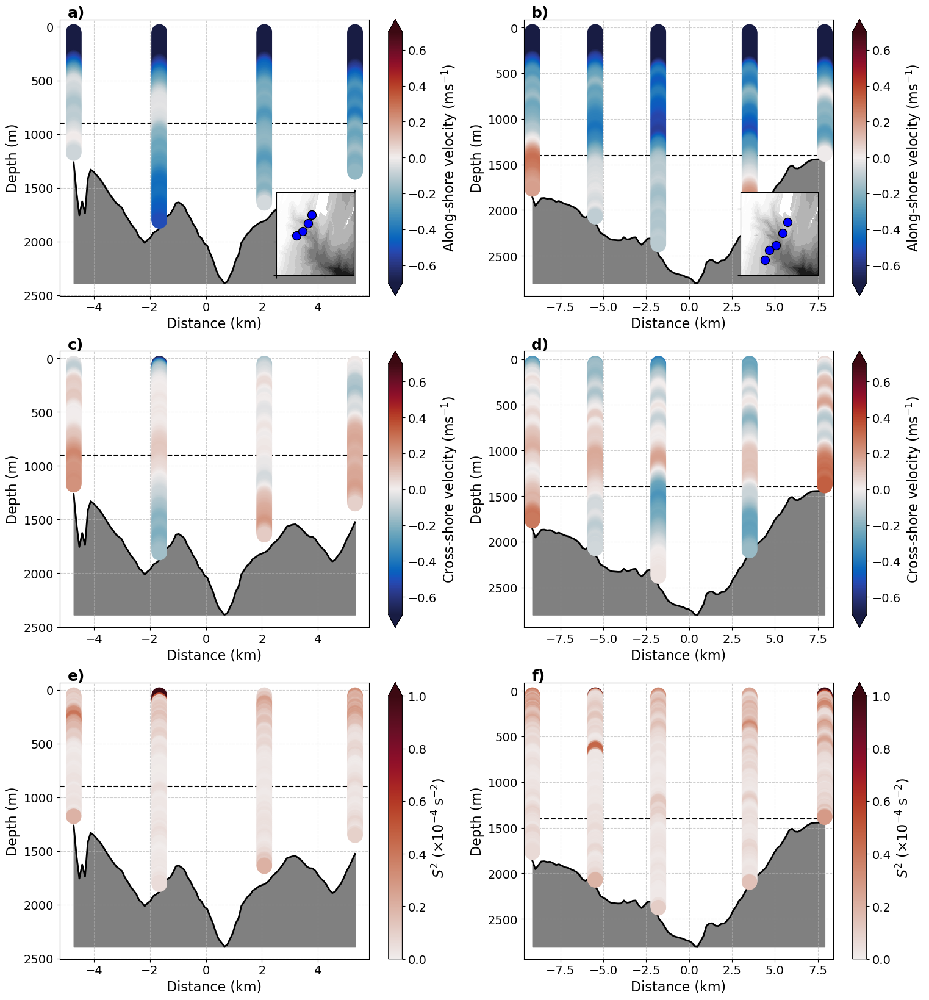

In [146]:
gs = gridspec.GridSpec(nrows=3, ncols=2, wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[18,20])
plt.rcParams['font.size'] = '16'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'

xmin=np.nanmin([np.nanmin(ds.cross_canyon.values) for ds in sol1_t2] )-0.5
xmax=np.nanmax([np.nanmax(ds.cross_canyon.values) for ds in sol1_t2] )+0.5


ax = fig.add_subplot(gs[0,0])
ax.text(0.025, 1.05,'a)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 u
plot_transect_vel(ax,sol1_t2, 'along', 'cross_canyon')
plt.axhline(900,c='k',linestyle='--')
plt.xlim(xmin,xmax)


axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-4800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1_t2):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='b', edgecolor='black', s=100)
axin.set_xlim([153.5,153.9])
axin.set_ylim([-30.2,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])


ax = fig.add_subplot(gs[1,0])
ax.text(0.025, 1.05,'c)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 1 v
plot_transect_vel(ax,sol1_t2,  'cross', 'cross_canyon')
plt.axhline(900,c='k',linestyle='--')
plt.xlim(xmin,xmax)




ax = fig.add_subplot(gs[2,0])
ax.text(0.025, 1.05,'e)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol1_t2, 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(900,c='k',linestyle='--')


xmin=np.nanmin([np.nanmin(ds.cross_canyon.values) for ds in sol1_t3])-0.5
xmax=np.nanmax([np.nanmax(ds.cross_canyon.values) for ds in sol1_t3])+0.5

ax = fig.add_subplot(gs[0,1])
ax.text(0.025, 1.05,'b)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 2 u
plot_transect_vel(ax,sol1_t3,  'along', 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(1400,c='k',linestyle='--')

axin = ax.inset_axes([0.7, 0.075, 0.25, 0.3])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-4800, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1_t3):
    latitudes = [cast['latitude']]
    longitudes = [cast['longitude']]
    axin.scatter(longitudes, latitudes, color='b', edgecolor='black', s=100)
axin.set_xlim([153.5,153.9])
axin.set_ylim([-30.2,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])

ax = fig.add_subplot(gs[1,1])
ax.text(0.025, 1.05,'d)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
#sol 2 v
plot_transect_vel(ax,sol1_t3,  'cross', 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(1400,c='k',linestyle='--')

ax = fig.add_subplot(gs[2,1])
ax.text(0.025, 1.05,'f)', transform=ax.transAxes, fontsize=18, va='top', fontweight='bold')
plot_transect_shear(ax,sol1_t3, 'cross_canyon')
plt.xlim(xmin,xmax)
plt.axhline(1400,c='k',linestyle='--')

In [151]:
sol1=[sol_mixing[11],sol_mixing[24]]
sol2=[sol_mixing[89],sol_mixing[90]]

In [152]:
for ds in sol1+sol2:
    ds['eps']=ds[['epsT1', 'epsT2']].mean(axis=1)

    ds['chi']=ds[['chiT1', 'chiT2']].mean(axis=1)

    ds['Kt']=ds[['KtT1', 'KtT2']].mean(axis=1)

    ds['Krho']=ds[['KrhoT1', 'KrhoT2']].mean(axis=1)

In [153]:
def average_yoyo(YOYO):    
# Find the common depth range across all datasets
    min_depth = min((-1*ds['depth']).min() for ds in YOYO)
    max_depth = max((-1*ds['depth']).max() for ds in YOYO)

    bin_size=2
    depth_bins = np.arange(min_depth, max_depth + bin_size, bin_size)
    depth_centers = (depth_bins[:-1] + depth_bins[1:]) / 2

    binned_datasets = []
    for i,ds in enumerate(YOYO): 
        df1 = pd.DataFrame({'depth': -1*ds['depth'],
                             'eps': np.log10(ds['epsT1']),
                             'Krho' : np.log10(ds['Krho'])})
        binned=df1.groupby(pd.cut(df1['depth'], depth_bins)).mean()
        binned["depth_bins"] = depth_centers
        binned_datasets.append(binned)

    combined = pd.concat(binned_datasets, ignore_index=True)
    result_mean = combined.groupby('depth_bins').mean().reset_index()

    return result_mean

C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\2741081877.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned=df1.groupby(pd.cut(df1['depth'], depth_bins)).mean()
c:\Users\uqmjef10\AppData\Local\miniconda3\envs\devel3.11\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224\2741081877.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned=df1.groupby(pd.cut(df1['depth'], depth_bins)).mean()
C:\Users\uqmjef10\AppData\Local\Temp\ipykernel_18224

[Text(0, -30.200000000000003, ''),
 Text(0, -30.1, ''),
 Text(0, -30.000000000000004, ''),
 Text(0, -29.900000000000002, '')]

<Figure size 640x480 with 0 Axes>

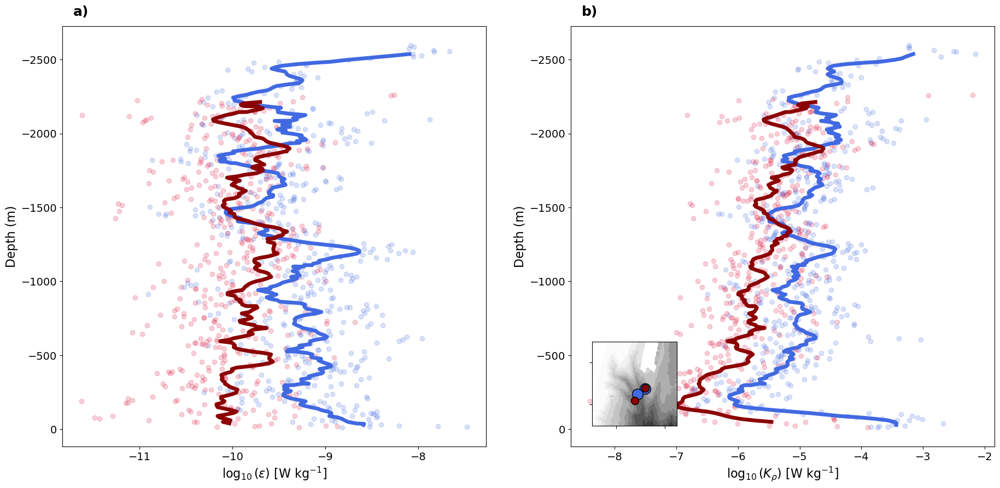

In [154]:

gs = gridspec.GridSpec(nrows=1,ncols=2,wspace=0.2, hspace=0.2)
plt.cla()
plt.clf()
fig= plt.figure(figsize=[22,10])
plt.rcParams['font.size'] = '14'
plt.rcParams['xtick.labelsize']='14'
plt.rcParams['ytick.labelsize']='14'
ax = None

ax=fig.add_subplot(gs[0,0])
for ds in sol1: 
        scatter = ax.scatter(np.log10(ds['eps']), -1*ds['depth'], c='royalblue',alpha=0.2)  
sol1_m=average_yoyo(sol1)
ds=sol1_m[~np.isnan(sol1_m.eps)]
plt.plot(pd.Series(ds.eps.values).rolling(window=10,center=True).mean(),pd.Series(ds.depth),linewidth=5,color='royalblue')

for ds in sol2: 
        scatter = ax.scatter(np.log10(ds['eps']), -1*ds['depth'], c='crimson',alpha=0.2)  
sol2_m=average_yoyo(sol2)
ds=sol2_m[~np.isnan(sol2_m.eps)]
plt.plot(pd.Series(ds.eps.values).rolling(window=10,center=True).mean(),pd.Series(ds.depth),linewidth=5,color='darkred')

plt.ylabel('Depth (m)',fontsize=16)
plt.xlabel(r'$\log_{10}(\varepsilon)$ [W kg$^{-1}$]',fontsize=16)



ax.text(0.025, 1.05, 'a)', transform=ax.transAxes,fontsize=18, va='top',fontweight='bold')
ax.invert_yaxis()




ax=fig.add_subplot(gs[0,1])


plt.ylabel('Depth (m)',fontsize=16)
plt.xlabel(r'$\log_{10}(K_{\rho})$ [W kg$^{-1}$]',fontsize=16)

ax.text(0.025, 1.05, 'b)', transform=ax.transAxes,fontsize=18, va='top',fontweight='bold')

for ds in sol1: 
        scatter = ax.scatter(np.log10(ds['Krho']), -1*ds['depth'], c='royalblue',alpha=0.2)  
sol1_m=average_yoyo(sol1)
ds=sol1_m[~np.isnan(sol1_m.Krho)]
plt.plot(pd.Series(ds.Krho.values).rolling(window=10,center=True).mean(),pd.Series(ds.depth),linewidth=5,color='royalblue')

for ds in sol2: 
        scatter = ax.scatter(np.log10(ds['Krho']), -1*ds['depth'], c='crimson',alpha=0.2)  
sol2_m=average_yoyo(sol2)
ds=sol2_m[~np.isnan(sol2_m.Krho)]
plt.plot(pd.Series(ds.Krho.values).rolling(window=10,center=True).mean(),pd.Series(ds.depth),linewidth=5,color='darkred')

ax.invert_yaxis()

axin = ax.inset_axes([0.05, 0.05, 0.2, 0.2])
axin.contourf(lon_bathy, lat_bathy, bathy.Band1, levels=np.arange(-4000, 200, 300), cmap='Greys_r', extend='both')
# Plot key points
for i, cast in enumerate(sol1):
    latitudes = [cast['latitude'][0]]
    longitudes = [cast['longitude'][0]]
    axin.scatter(longitudes, latitudes, color='royalblue', edgecolor='black', s=200)
for i, cast in enumerate(sol2):
    latitudes = [cast['latitude'][0]]
    longitudes = [cast['longitude'][0]]
    axin.scatter(longitudes, latitudes, color='darkred', edgecolor='black', s=100)
axin.set_xlim([153.5,153.85])
axin.set_ylim([-30.15,-29.95])
axin.set_xticklabels([])
axin.set_yticklabels([])